### Library

In [165]:
import os
import math
import copy
import torch
import random
import argparse
import matplotlib

import numpy as np
import pandas as pd
import seaborn as sns
import networkx as nx
import scipy.sparse as sp
import matplotlib.pyplot as plt
import torch.nn.functional as F

from torch import nn
from scipy import sparse
from matplotlib import gridspec

from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, SAGEConv
from scipy.spatial.distance import jensenshannon
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error
from torch_geometric.utils import degree, to_networkx, to_scipy_sparse_matrix, coalesce 
from torch_geometric.utils import subgraph, k_hop_subgraph, remove_self_loops
from scipy.stats import wasserstein_distance, pearsonr, spearmanr, entropy, \
                        ks_2samp, cramervonmises_2samp, ttest_ind, levene


### Models

In [ ]:
# 수정 버전 QpiGNN: train idx로 loss 학습하고, 전체 노드에 대해 지표를 저장
class GQNN(torch.nn.Module):
    def __init__(self, in_dim, hidden_dim, dual_output=True, fixed_margin=None, diff_act="softplus"):
        super().__init__()
        self.dual_output = dual_output
        self.fixed_margin = fixed_margin
        self.diff_act = diff_act

        self.conv1 = SAGEConv(in_dim, hidden_dim)
        self.conv2 = SAGEConv(hidden_dim, hidden_dim)

        if dual_output:
            self.fc_pred = torch.nn.Linear(hidden_dim, 1)
            if fixed_margin is None:
                self.fc_diff = torch.nn.Linear(hidden_dim, 1)
        else:
            self.fc_low = torch.nn.Linear(hidden_dim, 1)
            self.fc_upper = torch.nn.Linear(hidden_dim, 1)

    def _activate_diff(self, raw):
        if self.diff_act == "sigmoid":
            return torch.sigmoid(raw)  # (0,1)
        # softplus: (0, inf)
        return F.softplus(raw)

    def forward(self, x, edge_index):
        h = F.relu(self.conv1(x, edge_index))
        h = F.relu(self.conv2(h, edge_index))

        if self.dual_output:
            preds = self.fc_pred(h)

            if self.fixed_margin is not None:
                diffs = torch.ones_like(preds) * float(self.fixed_margin)
            else:
                diffs = self._activate_diff(self.fc_diff(h))

            pred_low  = preds - diffs
            pred_upper = preds + diffs
            return pred_low, pred_upper
        else:
            pred_low = self.fc_low(h)
            pred_upper = self.fc_upper(h)
            # interval ordering 보장(혹시 뒤집히면 교정)
            lo = torch.minimum(pred_low, pred_upper)
            up = torch.maximum(pred_low, pred_upper)
            return lo, up

class GQNNLoss(nn.Module):
    def __init__(self, target_coverage=0.9, lambda_factor=0.1):
        super().__init__()
        self.target_coverage = float(target_coverage)
        self.lf = float(lambda_factor)

    def forward(self, preds_low, preds_upper, target):
        # width penalty: 폭을 줄이도록
        diffs = (preds_upper - preds_low) / 2.0
        width_loss = self.lf * 2.0 * diffs.mean()

        below_violation = torch.relu(preds_low - target)   # y < lower
        above_violation = torch.relu(target - preds_upper) # y > upper
        total_violation = below_violation + above_violation

        is_violated = (target < preds_low) | (target > preds_upper)
        violation_count = is_violated.float().sum()

        if violation_count > 0:
            mean_violation = (total_violation * is_violated.float()).sum() / violation_count
        else:
            mean_violation = torch.tensor(0.0, device=target.device)

        covered = (preds_low <= target) & (target <= preds_upper)
        current_coverage = covered.float().mean()
        coverage_penalty = (self.target_coverage - current_coverage) ** 2

        return mean_violation + coverage_penalty + width_loss


In [126]:
# QpiGNN 모델 학습
def set_seed(seed=1127):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

def get_device():
    return torch.device("cuda" if torch.cuda.is_available() else "cpu")

def get_split_indices(data, split="train"):
    """
    다양한 데이터셋 포맷을 흡수:
    - idx_train / idx_val / idx_test (LongTensor of indices)
    - train_mask / val_mask / test_mask (Bool mask)
    """
    if split in ["train","val","test"]:
        idx_name = f"idx_{split}"
        mask_name = f"{split}_mask"
    else:
        raise ValueError("split must be one of train/val/test")

    if hasattr(data, idx_name):
        idx = getattr(data, idx_name)
        if idx is None: return None
        return idx.detach().cpu() if hasattr(idx, "detach") else torch.as_tensor(idx)

    if hasattr(data, mask_name):
        m = getattr(data, mask_name)
        if m is None: return None
        m = m.detach().cpu() if hasattr(m, "detach") else torch.as_tensor(m)
        return torch.where(m)[0]

    return None

@torch.no_grad()
def compute_node_uncertainty(pred_low, pred_upper, y_true):
    L = pred_low.view(-1)
    U = pred_upper.view(-1)
    y = y_true.view(-1)

    width = (U - L).clamp_min(0.0)
    covered = ((L <= y) & (y <= U)).float()

    below = torch.relu(L - y)
    above = torch.relu(y - U)
    violation = below + above

    # 정규화(데이터셋 스케일 다를 때 비교용)
    y_scale = torch.std(y).clamp_min(1e-6)
    width_norm = width / y_scale
    violation_norm = violation / y_scale

    return {
        "L": L.detach().cpu().numpy(),
        "U": U.detach().cpu().numpy(),
        "width": width.detach().cpu().numpy(),
        "covered": covered.detach().cpu().numpy(),
        "violation": violation.detach().cpu().numpy(),
        "width_norm": width_norm.detach().cpu().numpy(),
        "violation_norm": violation_norm.detach().cpu().numpy(),
    }

def train_gqnn_one_dataset(
    data,
    in_dim,
    hidden_dim=64,
    target_coverage=0.9,
    lambda_factor=0.1,
    lr=1e-3,
    weight_decay=1e-4,
    epochs=500,
    fixed_margin=None,
    diff_act="softplus",
    device=None,
    verbose=False,
):
    device = device or get_device()
    model = GQNN(in_dim, hidden_dim, dual_output=True, fixed_margin=fixed_margin, diff_act=diff_act).to(device)
    loss_fn = GQNNLoss(target_coverage=target_coverage, lambda_factor=lambda_factor).to(device)
    opt = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    data = data.to(device)
    x = data.x
    edge_index = data.edge_index
    y = data.y.view(-1, 1).float()

    idx_train = get_split_indices(data, "train")
    if idx_train is None:
        # German처럼 split 없으면 전체로 학습(권장X이지만 분석용)
        idx_train = torch.arange(x.size(0), device="cpu")

    idx_train = idx_train.to(device)

    for ep in range(1, epochs + 1):
        model.train()
        opt.zero_grad()

        L, U = model(x, edge_index)
        loss = loss_fn(L[idx_train], U[idx_train], y[idx_train])

        loss.backward()
        opt.step()

        if verbose and (ep % 50 == 0 or ep == 1):
            # train coverage 참고 출력
            with torch.no_grad():
                covered = ((L[idx_train] <= y[idx_train]) & (y[idx_train] <= U[idx_train])).float().mean().item()
                mean_w = (U[idx_train] - L[idx_train]).mean().item()
            print(f"Epoch {ep:4d} | loss={loss.item():.4f} | train_cov={covered:.3f} | train_width={mean_w:.3f}")

    # 전체 노드 uncertainty 계산
    model.eval()
    with torch.no_grad():
        L, U = model(x, edge_index)
    unc = compute_node_uncertainty(L, U, y)

    return model, unc


In [127]:
# 수정 버전 FnRGNN
class GroupWiseNorm(nn.Module):
    def __init__(self):
        super(GroupWiseNorm, self).__init__()

    def forward(self, pred, sensitive_attr):
        # 민감 속성 그룹 간 분포가 다르다는 것은 bias가 있을 수 있다는 뜻이고, 이를 fairness 관점에서 줄이려는 것
        # 두 그룹의 representation의 분포를 가깝게
        mask_0 = (sensitive_attr == 0).squeeze()
        mask_1 = (sensitive_attr == 1).squeeze()
        pred_0 = pred[mask_0]
        pred_1 = pred[mask_1]

        zero = torch.tensor(0.0, device=pred.device)
        mean_diff = torch.abs(pred_0.mean() - pred_1.mean()) if pred_0.numel() > 0 and pred_1.numel() > 0 else zero
        var_diff = torch.abs(pred_0.var() - pred_1.var()) if pred_0.numel() > 0 and pred_1.numel() > 0 else zero
        
        return mean_diff + var_diff

class FnRGNN(nn.Module):
    def __init__(self, nfeat, hidden_dim, dropout, lm, ld, mmd_sample, lr, weight_decay, fairness_mode="uniform"):
        super(FnRGNN, self).__init__()
        self.hidden_dim = hidden_dim
        self.dropout = dropout
        self.lambda2 = lm
        self.lambda_dist = ld
        self.mmd_sample_size = mmd_sample
        self.fairness_mode = fairness_mode

        self.gcn1 = GCNConv(nfeat, hidden_dim)
        self.gcn2 = GCNConv(hidden_dim, hidden_dim)
        self.classifier = nn.Linear(hidden_dim, 1)

        self.group_norm = GroupWiseNorm()
        self.optimizer = torch.optim.Adam(self.parameters(), lr=lr, weight_decay=weight_decay)
        self.criterion = nn.MSELoss()

    def compute_mmd(self, h, sensitive_attr):
        # adversarial loss 없이도 직접적인 distance loss로 추가 가능
        # 단점: 해당 속성이 뭔지 명확할 때만 쓸 수 있음. 즉, 민감 속성 라벨이 없는 경우에는 직접 쓰기 힘듦
        # 두 확률 분포 간의 평균 임베딩 차이를 측정해 그룹 간 분포가 비슷해지도록 압력
        # In-processing fairness constraints in model training: 목적: 모델이 학습 중에 민감 그룹 간 차이를 덜 반영하도록 압력 주고 싶다
        # 필요한 이유: fairness constraint를 soft하게 걸 수 있는 방법이 필요할 때, MMD는 differentiable하면서도 샘플 기반이라 유연하고 강력한 도구가 됨.
        mask_0 = (sensitive_attr == 0).squeeze()
        mask_1 = (sensitive_attr == 1).squeeze()
        h_0 = h[mask_0]
        h_1 = h[mask_1]
        
        if h_0.size(0) > self.mmd_sample_size:
            idx_0 = torch.randperm(h_0.size(0), device=h.device)[:self.mmd_sample_size]
            h_0 = h_0[idx_0]
        if h_1.size(0) > self.mmd_sample_size:
            idx_1 = torch.randperm(h_1.size(0), device=h.device)[:self.mmd_sample_size]
            h_1 = h_1[idx_1]
        
        if h_0.numel() == 0 or h_1.numel() == 0:
            return torch.tensor(0.0, device=h.device)
        
        sigma = 1.0
        dist_xx = torch.cdist(h_0, h_0) ** 2
        dist_yy = torch.cdist(h_1, h_1) ** 2
        dist_xy = torch.cdist(h_0, h_1) ** 2
        xx = torch.exp(-dist_xx / (2 * sigma**2)).mean()
        yy = torch.exp(-dist_yy / (2 * sigma**2)).mean()
        xy = torch.exp(-dist_xy / (2 * sigma**2)).mean()

        return xx + yy - 2 * xy

    def forward(self, data):
        x = data.x
        edge_index = data.edge_index
        sensitive_attr = data.sensitive_attr

        num_edges = edge_index.size(1)
        edge_weight = torch.ones(num_edges, device=x.device)
        sen_diff = sensitive_attr[edge_index[0]] != sensitive_attr[edge_index[1]]
        edge_weight[sen_diff] *= 0.5  # 민감 속성 다른 엣지 가중치 감소

        h = self.gcn1(x, edge_index, edge_weight=edge_weight)
        h = F.relu(h)
        h = F.dropout(h, self.dropout, training=self.training)
        h = self.gcn2(h, edge_index, edge_weight=edge_weight)
        h = F.relu(h)
        h = F.dropout(h, self.dropout, training=self.training)
        y = self.classifier(h)
        return y, h

    def optimize(self, data):
        labels, idx_train, sensitive_attr = (data.y, data.idx_train, data.sensitive_attr)
        self.train()
        self.optimizer.zero_grad()

        y, h = self.forward(data)

        # task는 train만
        task_loss = self.criterion(y[idx_train], labels[idx_train].unsqueeze(1).float())

        # fairness도 train만
        if self.fairness_mode == "uniform":
            idx_fair = idx_train
        elif self.fairness_mode == "low_degree":
            # degree 기반 conditional
            edge_index = data.edge_index
            deg = torch.bincount(edge_index[0], minlength=data.x.size(0))
            deg_train = deg[idx_train]

            # 하위 30% degree 노드는 제외: degree가 낮은(어려운) 노드 30%는 fairness에서 제외
            thr = torch.quantile(deg_train.float(), 0.3)
            idx_fair = idx_train[deg_train > thr]
        elif self.fairness_mode == "boundary":
            # boundary score 기반 conditional
            edge_index = data.edge_index
            sens = sensitive_attr

            nei_diff = (sens[edge_index[0]] != sens[edge_index[1]]).float()
            boundary_score = torch.zeros(data.x.size(0), device=h.device)
            boundary_score.index_add_(0, edge_index[0], nei_diff)

            b_train = boundary_score[idx_train]
            thr = torch.quantile(b_train, 0.7)  # 상위 boundary 제외: boundary_score 상위 30%를 찾는 것
            # 이웃이 많이 섞여 있어서 헷갈리는 노드들은 공정성 판단에서 잠시 제외
            idx_fair = idx_train[b_train < thr]
        elif self.fairness_mode == "norm_boundary":
            # normalized boundary score 기반 conditional
            edge_index = data.edge_index
            sens = sensitive_attr

            src, dst = edge_index[0], edge_index[1]
            nei_diff = (sens[src] != sens[dst]).float()

            # 노드별 different-neighbor count (분자)
            diff_cnt = torch.zeros(data.x.size(0), device=sens.device)
            diff_cnt.index_add_(0, src, nei_diff)

            # 노드별 degree (분모) - src 기준으로 카운트 (현재 구현과 동일한 기준)
            deg = torch.bincount(src, minlength=data.x.size(0)).float().to(sens.device)

            # 0-degree 방지 (train 노드에 0-degree가 있을 수 있으면 안전장치)
            deg = deg.clamp(min=1.0)
            boundary_score = diff_cnt / deg  # [0, 1]

            b_train = boundary_score[idx_train]
            thr = torch.quantile(b_train, 0.7)  # 상위 30% 제외 (기준은 그대로)
            idx_fair = idx_train[b_train < thr]
        else:
            raise ValueError(f"Unknown fairness_mode: {self.fairness_mode}")

        # fairness loss
        if idx_fair.numel() > 0:
            mmd_loss = self.compute_mmd(h[idx_fair], sensitive_attr[idx_fair])
            dist_loss = self.group_norm(y[idx_fair], sensitive_attr[idx_fair])
        else:
            zero = torch.tensor(0.0, device=h.device)
            mmd_loss = zero
            dist_loss = zero

        total_loss = task_loss + self.lambda2 * mmd_loss + self.lambda_dist * dist_loss
        total_loss.backward()
        self.optimizer.step()
        return total_loss.item()


### Functions

In [66]:
# dataset load
def dataset_config():
    config = {
        'region_job_r': {
            'path': "./dataset/pokec",
            'dataset': 'region_job',
            'predict_attr': 'completion_percentage',
            'sens_attr': 'region',
            'label_number': 500,
            # 고정값 대신 ratio로 통일 권장
            'sens_ratio': 0.01,   # train의 1%
            'sens_min': 50,
            'sens_max': 500,      # 너무 커지는 것 방지(원하면 None)
            'sens_number': None,  # ratio 쓸 거면 None 권장
            'test_idx': False,
            'dn': 'region_job_r'
        },

        'region_job_g': {
            'path': "./dataset/pokec",
            'dataset': 'region_job',
            'predict_attr': 'completion_percentage',
            'sens_attr': 'gender',
            'label_number': 500,
            'sens_ratio': 0.01,
            'sens_min': 50,
            'sens_max': 500,
            'sens_number': None,
            'test_idx': False,
            'dn': 'region_job_g'
        },

        'region_job_2_r': {
            'path': "./dataset/pokec",
            'dataset': 'region_job_2',
            'predict_attr': 'completion_percentage',
            'sens_attr': 'region',
            'label_number': 500,
            'sens_ratio': 0.01,
            'sens_min': 50,
            'sens_max': 500,
            'sens_number': None,
            'test_idx': False,
            'dn': 'region_job_2_r'
        },

        'region_job_2_g': {
            'path': "./dataset/pokec",
            'dataset': 'region_job_2',
            'predict_attr': 'completion_percentage',
            'sens_attr': 'gender',
            'label_number': 500,
            'sens_ratio': 0.01,
            'sens_min': 50,
            'sens_max': 500,
            'sens_number': None,
            'test_idx': False,
            'dn': 'region_job_2_g'
        },

        'nba_p': {
            'path': "./dataset/NBA",
            'dataset': 'nba',
            'predict_attr': 'PIE',
            'sens_attr': 'country',
            'label_number': 100,
            'sens_ratio': 0.25,   # train이 ~200이라 1%면 너무 작음. 예시로 25% (=~50) 맞춘 것.
            'sens_min': 50,
            'sens_max': 200,
            'sens_number': None,
            'test_idx': True,
            'dn': 'nba_p'
        },

        'nba_m': {
            'path': "./dataset/NBA",
            'dataset': 'nba',
            'predict_attr': 'MPG',
            'sens_attr': 'country',
            'label_number': 100,
            'sens_ratio': 0.25,   # 위와 동일
            'sens_min': 50,
            'sens_max': 200,
            'sens_number': None,
            'test_idx': True,
            'dn': 'nba_m'
        },

        # german은 N=1000, train~500이라 ratio=0.1이면 50개, ratio=1.0이면 500개
        'german_g': {
            'path': './dataset/NIFTY',
            'dataset': 'german',
            'predict_attr': 'LoanAmount',
            'sens_attr': 'Gender',
            'label_number': None,
            'sens_ratio': 0.10,
            'sens_min': 50,
            'sens_max': 500,
            'sens_number': None,
            'test_idx': None,
            'dn': 'german_g'
        },
        'german_f': {
            'path': './dataset/NIFTY',
            'dataset': 'german',
            'predict_attr': 'LoanAmount',
            'sens_attr': 'ForeignWorker',
            'label_number': None,
            'sens_ratio': 0.10,
            'sens_min': 50,
            'sens_max': 500,
            'sens_number': None,
            'test_idx': None,
            'dn': 'german_f'
        },
        'german_s': {
            'path': './dataset/NIFTY',
            'dataset': 'german',
            'predict_attr': 'LoanAmount',
            'sens_attr': 'Single',
            'label_number': None,
            'sens_ratio': 0.10,
            'sens_min': 50,
            'sens_max': 500,
            'sens_number': None,
            'test_idx': None,
            'dn': 'german_s'
        },
        'german_t': {
            'path': './dataset/NIFTY',
            'dataset': 'german',
            'predict_attr': 'LoanAmount',
            'sens_attr': 'HasTelephone',
            'label_number': None,
            'sens_ratio': 0.10,
            'sens_min': 50,
            'sens_max': 500,
            'sens_number': None,
            'test_idx': None,
            'dn': 'german_t'
        },
        'german_h': {
            'path': './dataset/NIFTY',
            'dataset': 'german',
            'predict_attr': 'LoanAmount',
            'sens_attr': 'OwnsHouse',
            'label_number': None,
            'sens_ratio': 0.10,
            'sens_min': 50,
            'sens_max': 500,
            'sens_number': None,
            'test_idx': None,
            'dn': 'german_h'
        },
        'german_e': {
            'path': './dataset/NIFTY',
            'dataset': 'german',
            'predict_attr': 'LoanAmount',
            'sens_attr': 'Unemployed',
            'label_number': None,
            'sens_ratio': 0.10,
            'sens_min': 50,
            'sens_max': 500,
            'sens_number': None,
            'test_idx': None,
            'dn': 'german_e'
        }
    }
    return config

def sens_number_from_ratio(train_n, ratio=0.01, min_n=50, max_n=None):
    if train_n is None:
        return None
    k = int(round(train_n * ratio))
    k = max(k, min_n)
    if max_n is not None:
        k = min(k, max_n)
    return k

def load_dataset_unified(dataset, sens_attr, predict_attr, seed, path="./dataset/", sens_number=500, test_idx=False):

    def feature_norm(features):
        min_values = features.min(axis=0)[0]
        max_values = features.max(axis=0)[0]
        return 2*(features - min_values).div(max_values-min_values) - 1

    def load_dataset(dataset, sens_attr, predict_attr, seed, path, sens_number):
        print(f'Loading {dataset} dataset from {path}')

        idx_features_labels = pd.read_csv(os.path.join(path, f"{dataset}.csv"))

        header = list(idx_features_labels.columns)
        header.remove("user_id")
        header.remove(sens_attr)
        header.remove(predict_attr)

        features = sp.csr_matrix(idx_features_labels[header], dtype=np.float32)
        labels = idx_features_labels[predict_attr].values.astype(np.float32)

        idx = np.array(idx_features_labels["user_id"], dtype=int)
        idx_map = {j: i for i, j in enumerate(idx)}

        edges_unordered = np.genfromtxt(os.path.join(path, f"{dataset}_relationship.txt"), dtype=np.int64)

        mapped_edges = []
        for u, v in edges_unordered:
            u_mapped = idx_map.get(u)
            v_mapped = idx_map.get(v)
            if u_mapped is not None and v_mapped is not None:
                mapped_edges.append((u_mapped, v_mapped))

        edges = np.array(mapped_edges, dtype=int)

        adj = sp.coo_matrix(
            (np.ones(edges.shape[0]), (edges[:, 0], edges[:, 1])),
            shape=(labels.shape[0], labels.shape[0]),
            dtype=np.float32
        )

        # symmetric
        adj = adj + adj.T.multiply(adj.T > adj) - adj.multiply(adj.T > adj)
        adj = adj + sp.eye(adj.shape[0], dtype=np.float32)

        features = torch.FloatTensor(np.array(features.todense()))
        labels = torch.FloatTensor(labels)

        random.seed(seed)

        sens_all = idx_features_labels[sens_attr].values
        valid_idx = np.where((sens_all >= 0) & ~pd.isna(sens_all))[0]
        sens_valid = sens_all[valid_idx]

        sss1 = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=seed)
        train_part, temp_part = next(sss1.split(valid_idx, sens_valid))

        sss2 = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=seed)
        val_part, test_part = next(sss2.split(temp_part, sens_valid[temp_part]))

        idx_train = torch.LongTensor(valid_idx[train_part])
        idx_val   = torch.LongTensor(valid_idx[temp_part[val_part]])
        idx_test  = torch.LongTensor(valid_idx[temp_part[test_part]])

        sens = torch.FloatTensor(sens_all.astype(np.float32))

        # 임시 sens_train (최종은 load_and_prepare_dataset에서 ratio로 재샘플)
        sens_idx = set(np.where((sens_all >= 0) & ~pd.isna(sens_all))[0])
        idx_sens_train_pool = list(sens_idx - set(idx_val.numpy()) - set(idx_test.numpy()))
        random.seed(seed)
        random.shuffle(idx_sens_train_pool)
        idx_sens_train = torch.LongTensor(idx_sens_train_pool[:min(sens_number, len(idx_sens_train_pool))])

        if dataset == 'nba':
            features = feature_norm(features)

        return adj, features, labels, idx_train, idx_val, idx_test, sens, idx_sens_train

    def sp2sptensor(m):
        sparse_m = sp.coo_matrix(m).astype(np.float32)
        indices = torch.from_numpy(np.vstack((sparse_m.row, sparse_m.col))).long()
        values = torch.from_numpy(sparse_m.data).float()
        shape = torch.Size(sparse_m.shape)
        return torch.sparse_coo_tensor(indices, values, shape).coalesce()

    def symetric_normalize(m, half: bool):
        if half:
            m = m + m.T - np.diag(np.diagonal(m))
        hat_m = m + np.eye(m.shape[0], dtype=m.dtype)
        D = np.sum(hat_m, axis=1)
        D = np.diag(D)
        with np.errstate(divide='ignore'):
            D = np.power(D, -0.5)
            D[np.isinf(D)] = 0
        return D @ hat_m @ D

    class GermanRegression:
        """
        German을 '따로' 로드하되:
        - labels: cfg의 predict_attr (회귀 float)
        - sens: cfg의 sens_attr
        - edges: txt 기반
        """
        def __init__(self, path, sens_attr, predict_attr, seed, sens_number):
            self.data_path = path
            self.sens_attr = sens_attr
            self.predict_attr = predict_attr
            self.seed = seed
            self.sens_number = sens_number

            self.df = self._load_csv()
            self.A_tensor, self.A = self._load_edges()
            self.features, self.labels, self.sens = self._build_tensors()
            self.idx_train, self.idx_val, self.idx_test = self._split()
            self.idx_sens_train = self._build_sens_train()

        def _load_csv(self):
            # 폴더 내 csv 1개를 읽는 기존 관행 유지
            filenames = [f for f in os.listdir(self.data_path) if f.endswith(".csv")]
            if len(filenames) == 0:
                raise ValueError("No CSV found in German path.")
            df = pd.read_csv(os.path.join(self.data_path, filenames[0]))

            # 문자열/범주 처리(기존 코드 최대한 유지)
            if "Gender" in df.columns and df["Gender"].dtype == object:
                gender_map = {'Female': 0, 'Male': 1}
                df["Gender"] = df["Gender"].map(gender_map).fillna(-1).astype(int)

            if "PurposeOfLoan" in df.columns and df["PurposeOfLoan"].dtype == object:
                purpose_list = list(df["PurposeOfLoan"].dropna().astype(str).unique())
                random.seed(self.seed)
                random.shuffle(purpose_list)
                purpose_dict = {p: i for i, p in enumerate(purpose_list)}
                df["PurposeOfLoan"] = df["PurposeOfLoan"].map(purpose_dict).fillna(-1).astype(int)

            # sens_attr가 문자열이면 숫자로 바꾸기(이진이면 특히 필요)
            if self.sens_attr in df.columns and df[self.sens_attr].dtype == object:
                vals = list(df[self.sens_attr].dropna().astype(str).unique())
                random.seed(self.seed)
                random.shuffle(vals)
                mp = {v: i for i, v in enumerate(vals)}
                df[self.sens_attr] = df[self.sens_attr].map(mp).fillna(-1).astype(int)

            return df

        def _load_edges(self):
            filenames = [f for f in os.listdir(self.data_path) if f.endswith(".txt")]
            if len(filenames) == 0:
                raise ValueError("No edge TXT found in German path.")

            edges = np.loadtxt(os.path.join(self.data_path, filenames[0])).astype(int)

            n = len(self.df)
            A = np.zeros((n, n), dtype=np.float32)
            for u, v in edges:
                if 0 <= u < n and 0 <= v < n:
                    A[u, v] = 1
                    A[v, u] = 1

            # (선택) normalized adjacency tensor (기존 클래스 스타일 유지)
            sym_norm_A = symetric_normalize(A, half=False)
            A_tensor = sp2sptensor(sym_norm_A)

            return A_tensor, A

        def _build_tensors(self):
            # feature cols = (predict_attr, sens_attr 제외)
            feature_cols = [c for c in self.df.columns if c not in [self.predict_attr, self.sens_attr]]
            # 숫자가 아닌 컬럼이 남아있으면 숫자로 변환 시도/제거
            X = self.df[feature_cols].copy()

            for c in X.columns:
                if X[c].dtype == object:
                    # 남아있는 object는 카테고리 인코딩
                    vals = list(X[c].dropna().astype(str).unique())
                    random.seed(self.seed)
                    random.shuffle(vals)
                    mp = {v: i for i, v in enumerate(vals)}
                    X[c] = X[c].map(mp).fillna(-1).astype(int)

            features = torch.FloatTensor(np.array(X, dtype=np.float32))

            y = self.df[self.predict_attr].values.astype(np.float32)
            labels = torch.FloatTensor(y)

            s = self.df[self.sens_attr].values.astype(np.float32)
            sens = torch.FloatTensor(s)

            return features, labels, sens

        def _split(self):
            # 회귀라 label stratify는 하지 말고, sens로 stratify
            sens_all = self.sens.detach().cpu().numpy()
            valid_idx = np.where((sens_all >= 0) & ~pd.isna(sens_all))[0]
            sens_valid = sens_all[valid_idx]

            sss1 = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=self.seed)
            train_part, temp_part = next(sss1.split(valid_idx, sens_valid))

            sss2 = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=self.seed)
            val_part, test_part = next(sss2.split(temp_part, sens_valid[temp_part]))

            idx_train = torch.LongTensor(valid_idx[train_part])
            idx_val   = torch.LongTensor(valid_idx[temp_part[val_part]])
            idx_test  = torch.LongTensor(valid_idx[temp_part[test_part]])
            return idx_train, idx_val, idx_test

        def _build_sens_train(self):
            sens_all = self.sens.detach().cpu().numpy()
            sens_idx = set(np.where((sens_all >= 0) & ~pd.isna(sens_all))[0])
            pool = list(sens_idx - set(self.idx_val.numpy()) - set(self.idx_test.numpy()))
            random.seed(self.seed)
            random.shuffle(pool)
            k = min(self.sens_number, len(pool))
            return torch.LongTensor(pool[:k])

    # ---- main switch ----
    if dataset.lower() != 'german':
        return load_dataset(dataset, sens_attr, predict_attr, seed, path, sens_number)

    # ✅ German은 따로 로드
    print(f'Loading german dataset from {path}')
    gd = GermanRegression(path, sens_attr=sens_attr, predict_attr=predict_attr, seed=seed, sens_number=sens_number)

    # 여기서 adj는 sparse tensor로 주고, 나머지는 통일
    # (주의) load_and_prepare_dataset에서 torch.Tensor adj면 ._indices()로 edge 빼니까 OK
    return gd.A_tensor, gd.features, gd.labels, gd.idx_train, gd.idx_val, gd.idx_test, gd.sens, gd.idx_sens_train

def load_and_prepare_dataset(dataset_config, config_name, seed, normalize=True):
    cfg = dataset_config.get(config_name)
    if cfg is None:
        raise ValueError(f"Dataset '{config_name}' not found in dataset_config.")

    path = cfg['path']
    dataset_name = cfg['dataset']
    predict_attr = cfg['predict_attr']
    sens_attr = cfg['sens_attr']
    test_idx = cfg.get('test_idx', False)

    # ratio 설정
    sens_ratio = cfg.get("sens_ratio")        # None이면 sens_number_cfg 사용
    sens_min   = cfg.get("sens_min", 50)
    sens_max   = cfg.get("sens_max", None)
    sens_number_cfg = cfg.get("sens_number")

    # ⚠ df는 config_name 기준이 아니라 실제 파일명 기준으로 읽어야 함
    df = pd.read_csv(f"{path}/{dataset_name}.csv")

    # 1) 일단 크게 로드(나중에 ratio 기반 재샘플)
    sens_number_for_load = (10**9 if sens_ratio is not None else (sens_number_cfg if sens_number_cfg is not None else 10**9))

    adj, features, labels, idx_train, idx_val, idx_test, sens, idx_sens_train = load_dataset_unified(
        dataset_name, sens_attr, predict_attr, seed, path, sens_number_for_load, test_idx
    )

    # 2) disconnected 제거 (하지만 self-loop가 있으면 사실상 거의 안 제거됨)
    if isinstance(adj, torch.Tensor):
        deg = torch.sparse.sum(adj, dim=1).to_dense().cpu().numpy()
    else:
        deg = np.array(adj.sum(axis=1)).flatten()

    connected_mask = deg > 0
    connected_idx = np.where(connected_mask)[0]
    old_to_new = {old: new for new, old in enumerate(connected_idx)}

    # node-level 필터
    features = features[connected_idx]
    labels   = labels[connected_idx]
    sens     = sens[connected_idx]

    # split remap
    idx_train = torch.tensor([old_to_new[i.item()] for i in idx_train if i.item() in old_to_new], dtype=torch.long)
    idx_val   = torch.tensor([old_to_new[i.item()] for i in idx_val   if i.item() in old_to_new], dtype=torch.long)
    idx_test  = torch.tensor([old_to_new[i.item()] for i in idx_test  if i.item() in old_to_new], dtype=torch.long)

    # 3) edge_index 만들기 (sparse adj에서 indices 추출 후 connected만 필터)
    if isinstance(adj, torch.Tensor):
        edge_index_np = adj._indices().cpu().numpy()
        src, dst = edge_index_np[0], edge_index_np[1]
    else:
        adj = adj.tocoo()
        src, dst = adj.row, adj.col

    mask = np.isin(src, connected_idx) & np.isin(dst, connected_idx)
    src_f = np.array([old_to_new[i] for i in src[mask]], dtype=np.int64)
    dst_f = np.array([old_to_new[i] for i in dst[mask]], dtype=np.int64)

    edge_index = torch.tensor(np.vstack([src_f, dst_f]), dtype=torch.long)

    # coalesce로 중복 제거/정렬
    edge_index, _ = coalesce(edge_index, None)

    # sparse adj도 재구축
    N = len(connected_idx)
    new_adj = torch.sparse_coo_tensor(
        indices=edge_index,
        values=torch.ones(edge_index.size(1), dtype=torch.float32),
        size=(N, N)
    ).coalesce()

    # 4) ✅ sens_train 재샘플: ratio 기반이면 여기서 결정
    #    후보 풀 = sens 관측 가능(sens>=0) AND val/test 제외
    sens_known = torch.where(sens >= 0)[0]
    banned = set(idx_val.tolist()) | set(idx_test.tolist())
    pool = [i.item() for i in sens_known if i.item() not in banned]

    random.seed(seed)
    random.shuffle(pool)

    if sens_ratio is not None:
        k = sens_number_from_ratio(train_n=len(idx_train), ratio=sens_ratio, min_n=sens_min, max_n=sens_max)
    else:
        # 고정값(없으면 전부)
        k = sens_number_cfg if sens_number_cfg is not None else len(pool)

    k = min(k, len(pool))
    idx_sens_train = torch.tensor(pool[:k], dtype=torch.long)

    # 5) sens 이진화는 "모든 데이터에 일괄" 적용하면 위험함(특히 region/country)
    #    원하면 cfg에 sens_binary=True를 넣어서 켜는 방식으로.
    if cfg.get("sens_binary", False):
        sens = (sens > 0).float()

    # 출력(간단)
    if cfg.get("sens_binary", False):
        print(f"[{config_name}] sens=0: {(sens==0).sum().item()}, sens=1: {(sens==1).sum().item()}, sens_train_n={len(idx_sens_train)}")
    else:
        # 다중 범주 sens일 수 있으니 unique 수만
        print(f"[{config_name}] sens_unique={sens.unique().numel()}, sens_train_n={len(idx_sens_train)}")
    print('-' * 50)

    # 6) normalize
    x_scaler, y_scaler = None, None
    if normalize:
        x_scaler = StandardScaler()
        features = torch.tensor(x_scaler.fit_transform(features.cpu().numpy()), dtype=torch.float32)

        y_scaler = StandardScaler()
        labels = torch.tensor(y_scaler.fit_transform(labels.cpu().numpy().reshape(-1, 1)), dtype=torch.float32).view(-1)

    # 7) PyG Data
    data = Data(
        x=features,
        edge_index=edge_index,
        y=labels.float(),              # 회귀
        sensitive_attr=sens.float(),   # 값 유지(이진/다중 모두 가능)
        adj=new_adj
    )
    data.idx_train = idx_train
    data.idx_val = idx_val
    data.idx_test = idx_test
    data.idx_sens_train = idx_sens_train

    return data, df, cfg


In [76]:
# dataset 민감 속성 비율 확인
def print_sensitive_attr_distribution(data_dict):
    sens = data_dict['sensitive_attr']  # torch.FloatTensor
    for split in ['idx_train', 'idx_val', 'idx_test']:
        idx = data_dict[split]
        values = sens[idx].numpy()
        unique, counts = np.unique(values, return_counts=True)
        total = len(values)
        print(f"[{split}] 총 {total}개")
        for u, c in zip(unique, counts):
            print(f"  민감속성 {int(u)}: {c}개 ({c/total:.1%})")
        print("-" * 30)

# dataset 통계량
def extract_split_stats(data):
    split = {}
    if data is None:
        return split

    # mask 방식
    for name in ["train", "val", "test"]:
        mask = getattr(data, f"{name}_mask", None)
        if mask is not None:
            try:
                split[f"{name}_n"] = int(mask.sum().item())
            except Exception:
                pass

    # idx 방식
    for name in ["train", "val", "test", "sens_train"]:
        idx = getattr(data, f"idx_{name}", None)
        if idx is not None:
            try:
                split[f"{name}_n"] = int(len(idx))
            except Exception:
                pass

    return split

def edge_stats_undirected(edge_index, num_nodes):
    """
    edge_index: [2, E] (PyG)
    반환:
      E_dir: directed edge count (edge_index 컬럼 수)
      E_undir_unique: unique undirected edge count (u<v 기준 unique)
      self_loops
      density_undir: 2*E_undir_unique / (N*(N-1))
      reverse_edge_ratio: (u,v)마다 (v,u)도 있는지 비율(근사)
    """
    if edge_index is None or num_nodes is None:
        return 0, 0, 0, None, None

    E_dir = int(edge_index.size(1))
    src = edge_index[0].detach().cpu().numpy().astype(np.int64)
    dst = edge_index[1].detach().cpu().numpy().astype(np.int64)

    self_loops = int(np.sum(src == dst))

    # unique undirected edges (self-loop 제외)
    mask = (src != dst)
    a = np.minimum(src[mask], dst[mask])
    b = np.maximum(src[mask], dst[mask])

    # 해시로 unique 계산
    h = a * (num_nodes + 1) + b
    E_undir_unique = int(np.unique(h).size)

    density_dir = None
    density_undir = None

    if num_nodes is not None and num_nodes > 1:
        # directed density (주력 지표)
        density_dir = float(num_edges / (num_nodes * (num_nodes - 1)))

        # undirected density (구조 설명용 보조 지표)
        density_undir = float(
            2 * E_undir_unique / (num_nodes * (num_nodes - 1))
        )

    # reverse 존재 비율(대략)
    directed_hash = (src * (num_nodes + 1) + dst).tolist()
    directed_set = set(directed_hash)
    rev = 0
    for u, v in zip(src, dst):
        if (v * (num_nodes + 1) + u) in directed_set:
            rev += 1
    reverse_edge_ratio = float(rev / E_dir) if E_dir > 0 else None

    return E_dir, E_undir_unique, self_loops, density_dir, density_undir, reverse_edge_ratio

def regression_label_stats(y):
    """
    y: torch.Tensor 또는 np.ndarray
    반환: y_mean, y_std, y_min, y_max, y_q05, y_q50, y_q95, y_missing_ratio
    """
    if y is None:
        return {}

    try:
        if hasattr(y, "detach"):
            y_np = y.detach().cpu().numpy()
        else:
            y_np = np.asarray(y)

        y_np = y_np.reshape(-1)
        missing_ratio = float(np.mean(pd.isna(y_np)))
        y_np = y_np[~pd.isna(y_np)]

        if y_np.size == 0:
            return {"y_missing_ratio": missing_ratio}

        return {
            "y_missing_ratio": missing_ratio,
            "y_mean": float(np.mean(y_np)),
            "y_std": float(np.std(y_np)),
            "y_min": float(np.min(y_np)),
            "y_max": float(np.max(y_np)),
            "y_q05": float(np.quantile(y_np, 0.05)),
            "y_q50": float(np.quantile(y_np, 0.50)),
            "y_q95": float(np.quantile(y_np, 0.95)),
        }
    except Exception:
        return {}

def _value_counts(series, dropna=False, normalize=False):
    if series is None:
        return None
    vc = series.value_counts(dropna=dropna, normalize=normalize)
    out = {}
    for k, v in vc.items():
        key = "NaN" if (pd.isna(k)) else str(k)
        out[key] = float(v) if normalize else int(v)
    return out

def dataset_statistics(
    dt_dict,
    label_col=None,
    compute_sens_homophily=False,
    topk_groups=10, # group 분포 dict가 너무 커지면 상위 k만
    task="auto",                 # "auto"|"regression"|"classification"
):
    summary_rows = []
    details = {}

    def _topk(d):
        if d is None or len(d) <= topk_groups:
            return d
        items = sorted(d.items(), key=lambda kv: kv[1], reverse=True)[:topk_groups]
        rest = sum(v for _, v in d.items()) - sum(v for _, v in items)
        out = dict(items)
        out["__REST__"] = int(rest) if rest > 0 else 0
        return out

    for ds, pack in dt_dict.items():
        data = pack.get("data", None)
        df   = pack.get("df", None)
        cfg  = pack.get("cfg", {}) or {}

        # N
        if data is not None and getattr(data, "num_nodes", None) is not None:
            num_nodes = int(data.num_nodes)
        else:
            num_nodes = len(df) if isinstance(df, pd.DataFrame) else None

        # edges
        edge_index = getattr(data, "edge_index", None) if data is not None else None
        if edge_index is not None and num_nodes is not None:
            E_dir, E_undir, self_loops, density_dir, density_undir, reverse_edge_ratio = edge_stats_undirected(edge_index, num_nodes)
        else:
            E_dir, E_undir, self_loops, density_dir, density_undir, reverse_edge_ratio = 0, 0, 0, None, None, None

        # degree (undirected처럼 src/dst 둘 다 합산해도 됨: 네 그래프는 대칭이라 평균은 비슷)
        avg_degree = None
        max_degree = None
        if edge_index is not None and num_nodes is not None and E_dir > 0:
            import torch
            src = edge_index[0]
            dst = edge_index[1]
            deg = torch.zeros(num_nodes, dtype=torch.long, device=edge_index.device)
            deg.scatter_add_(0, src, torch.ones_like(src, dtype=torch.long))
            deg.scatter_add_(0, dst, torch.ones_like(dst, dtype=torch.long))
            deg_np = deg.detach().cpu().numpy()
            avg_degree = float(deg_np.mean())
            max_degree = int(deg_np.max())

        # features
        x = getattr(data, "x", None) if data is not None else None
        num_features = int(x.size(1)) if x is not None and hasattr(x, "dim") and x.dim() == 2 else None

        # label y
        y = getattr(data, "y", None) if data is not None else None

        # task 결정
        task_eff = task
        if task == "auto":
            # 매우 단순 휴리스틱: y가 float면 회귀로
            if y is not None and hasattr(y, "dtype"):
                task_eff = "regression" if str(y.dtype).startswith("torch.float") else "classification"
            else:
                task_eff = "classification"

        num_classes = None
        y_counts = None
        y_reg = {}

        if task_eff == "classification":
            if y is not None:
                try:
                    y_np = y.detach().cpu().numpy().reshape(-1)
                    y_np = y_np[~pd.isna(y_np)]
                    if y_np.size > 0:
                        vals, cnts = np.unique(y_np, return_counts=True)
                        num_classes = int(vals.size)
                        y_counts = {str(int(v)): int(c) for v, c in zip(vals, cnts)}
                except Exception:
                    pass
        else:
            y_reg = regression_label_stats(y)

        # df label counts(분류일 때만 의미 있음)
        df_label_counts = None
        if task_eff == "classification" and isinstance(df, pd.DataFrame) and label_col and (label_col in df.columns):
            df_label_counts = _value_counts(df[label_col], dropna=False, normalize=False)
            if num_classes is None and df_label_counts is not None:
                num_classes = len(df_label_counts)

        # sensitive
        sens_attr = cfg.get("sens_attr", None)
        sens_series = None
        if isinstance(df, pd.DataFrame) and sens_attr is not None and sens_attr in df.columns:
            sens_series = df[sens_attr]

        num_groups = int(sens_series.nunique(dropna=False)) if sens_series is not None else None
        sens_missing_ratio = float(sens_series.isna().mean()) if sens_series is not None else None
        sens_counts = _topk(_value_counts(sens_series, dropna=False, normalize=False))
        sens_props  = _topk(_value_counts(sens_series, dropna=False, normalize=True))
        min_group_prop = float(min(sens_props.values())) if sens_props else None

        # splits
        split = extract_split_stats(data)

        # sens homophily
        sens_homophily = None
        if compute_sens_homophily and (sens_series is not None) and (edge_index is not None):
            try:
                svals = sens_series.to_numpy()
                src = edge_index[0].detach().cpu().numpy()
                dst = edge_index[1].detach().cpu().numpy()
                ok = (src < len(svals)) & (dst < len(svals))
                src = src[ok]; dst = dst[ok]
                same = (svals[src] == svals[dst])
                sens_homophily = float(np.mean(same)) if same.size > 0 else None
            except Exception:
                sens_homophily = None

        row = {
            "dataset": ds,
            # "task": task_eff, 

            "num_nodes": num_nodes,
            "num_features": num_features,
            "train_n": split.get("train_n"),
            "val_n": split.get("val_n"),
            "test_n": split.get("test_n"),

            "num_edges_dir": E_dir,            # edge_index에 들어있는 directed edge 수
            # "num_edges_undir": E_undir,        # unique 무방향 edge 수(중복/역방향 제거)
            # "self_loops": self_loops,
            "edge_density_dir": round(density_dir, 4),
            # "edge_density_undir": round(density_undir, 4),
            # "reverse_edge_ratio": round(reverse_edge_ratio, 4),

            "avg_degree": round(avg_degree, 4),
            "max_degree": max_degree,

            "sens_attr": sens_attr,
            "sens_train_n": split.get("sens_train_n"), # 민감 속성 샘플 수
            # "num_sensitive_groups": num_groups, # 민감 속성 그룹 수
            "min_group_prop": round(min_group_prop, 4), # 각장 작은 그룹의 비율 / 불균형 심할수록 작음
            # "sens_missing_ratio": sens_missing_ratio, # 민감속성 결측 비율 / 결측 많으면 fairness 평가 자체가 흔들림
            "sens_homophily": round(sens_homophily, 4), # 엣지 양끝 sens 동일 비율,
        }

        # label 관련: 분류면 num_classes, 회귀면 y 통계
        # if task_eff == "classification":
        #     row["num_classes"] = num_classes
        # else:
        #     row.update(y_reg)

        summary_rows.append(row)

        details[ds] = {
            "sens_counts": sens_counts,
            "sens_props": sens_props,
            "y_counts_from_data": y_counts,
            "y_counts_from_df": df_label_counts,
            "cfg": cfg,
        }

    summary_df = pd.DataFrame(summary_rows).reset_index(drop=True)
    return summary_df, details


In [ ]:
# dataset 시각화
def _ecdf(values: np.ndarray):
    x = np.sort(values)
    n = len(x)
    y = np.arange(1, n + 1) / n
    return x, y

def plot_y_ecdf_with_group_vlines(
    pack,
    split="all",          # "all" | "train" | "val" | "test"
    min_samples=20,
    vlines=("mean",),   # ("mean","median","iqr") 중 선택. 
):
    df   = pack["df"]
    cfg  = pack["cfg"]
    data = pack["data"]

    name  = cfg.get("dn", "")
    y_col = cfg["predict_attr"]
    s_col = cfg["sens_attr"]

    if y_col not in df.columns:
        print(f"[SKIP] {name}: y column '{y_col}' not in df")
        return
    if s_col not in df.columns:
        print(f"[SKIP] {name}: sensitive column '{s_col}' not in df")
        return

    # split 인덱싱
    if split == "all":
        df_s = df
        split_tag = "All"
    else:
        idx_name = f"idx_{split}"
        if not hasattr(data, idx_name):
            print(f"[SKIP] {name}: data has no {idx_name} (cannot split='{split}')")
            return
        idx = getattr(data, idx_name)
        idx = idx.detach().cpu().numpy() if hasattr(idx, "detach") else np.asarray(idx)
        df_s = df.iloc[idx]
        split_tag = split.capitalize()

    # 결측 제거 + 타입 정리
    tmp = df_s[[y_col, s_col]].dropna().copy()
    tmp[y_col] = pd.to_numeric(tmp[y_col], errors="coerce")
    tmp = tmp.dropna(subset=[y_col, s_col])

    if len(tmp) == 0:
        print(f"[SKIP] {name}: no valid rows after cleaning")
        return

    groups = sorted(tmp[s_col].unique())

    fig, ax = plt.subplots(figsize=(6, 4))

    for g in groups:
        vals = tmp.loc[tmp[s_col] == g, y_col].to_numpy(dtype=float)
        n = len(vals)
        if n < min_samples:
            print(f"[SKIP] {name} | {s_col}={g} (n={n})")
            continue

        x, y = _ecdf(vals)
        ax.step(x, y, where="post", label=f"{s_col}={g} (n={n})")

        # 방금 그린 ECDF 선 색으로 수직선 찍기
        color = ax.lines[-1].get_color()

        if "mean" in vlines:
            ax.axvline(np.mean(vals), linestyle="--", linewidth=2, alpha=0.95, color=color)

        if "median" in vlines:
            ax.axvline(np.median(vals), linestyle=":", linewidth=2, alpha=0.95, color=color)

        if "iqr" in vlines:
            q25, q75 = np.quantile(vals, [0.25, 0.75])
            ax.axvline(q25, linestyle="-.", linewidth=1, alpha=0.7, color=color)
            ax.axvline(q75, linestyle="-.", linewidth=1, alpha=0.7, color=color)

    ax.set_xlabel(y_col)
    ax.set_ylabel("ECDF")
    ax.set_title(f"{name} – ECDF by Sensitive Group ({split_tag})")
    ax.grid(alpha=0.3)
    ax.legend(loc="lower right")
    plt.tight_layout()
    plt.show()


In [122]:
# dataset 그래프 시각화
def get_test_subgraph(data):
    test_idx = data.idx_test
    edge_index_test, _ = subgraph(
        subset=test_idx,
        edge_index=data.edge_index,
        relabel_nodes=True,        # test 노드만 0..n-1로 재번호
        num_nodes=data.num_nodes
    )
    sens_test = data.sensitive_attr[test_idx].detach().cpu()
    return edge_index_test, sens_test, test_idx

def sample_nodes(idx: torch.Tensor, k: int, seed: int = 0) -> torch.Tensor:
    idx = idx.detach().cpu()
    if len(idx) <= k:
        return idx
    g = torch.Generator().manual_seed(seed)
    perm = torch.randperm(len(idx), generator=g)[:k]
    return idx[perm]

def build_sens_color_map(sens_values):
    """
    sens_values: 1D tensor or array (민감속성 값)
    return: dict {sens_value: color}
    """
    uniq = sorted(set(sens_values.tolist()))
    cmap = plt.cm.get_cmap("tab10", len(uniq))  # 최대 10개까지 안정적

    color_map = {sv: cmap(i) for i, sv in enumerate(uniq)}
    return color_map

def build_binary_sens_color_map():
    """
    Binary sensitive attribute (0/1) 전용 고대비 컬러맵
    """
    return {
        0: "#1f77b4",  # blue
        1: "#ff7f0e",  # orange
    }

def plot_edge_index_by_sens_color(
    edge_index,
    sens,
    title="",
    node_size=10,
    seed=0,
):
    """
    edge_index: [2, E]
    sens: [N] (relabel된 노드 순서와 일치)
    """
    ei = edge_index.detach().cpu()
    sens_np = sens.detach().cpu()

    G = nx.Graph()
    G.add_edges_from(ei.t().numpy())

    # 고립 노드 포함
    for i in range(len(sens_np)):
        if i not in G:
            G.add_node(i)

    pos = nx.spring_layout(G, seed=seed)
    uniq = sorted(set(sens_np.tolist()))
    
    # 민감속성별 색상 고정
    if len(uniq) == 2:
        color_map = build_binary_sens_color_map()
    else:
        cmap = matplotlib.colormaps.get_cmap("tab20")
        color_map = {sv: cmap(i % cmap.N) for i, sv in enumerate(uniq)}
    node_colors = [color_map[int(sens_np[i])] for i in G.nodes()]

    plt.figure(figsize=(9, 7))
    nx.draw_networkx_edges(G, pos, alpha=0.12, width=0.5)
    nx.draw_networkx_nodes(
        G, pos,
        node_color=node_colors,
        node_size=node_size,
        linewidths=0
    )

    # 범례
    handles = [
        plt.Line2D([0], [0], marker='o', color='w',
                   label=f"{k}",
                   markerfacecolor=v, markersize=8)
        for k, v in color_map.items()
    ]
    plt.legend(handles=handles, title="Sensitive Attribute", loc="best")

    plt.title(title)
    plt.axis("off")
    plt.show()

def visualize_test_induced_subgraph(
    ds,
    data,
    sens_name="sens",
    k_test_nodes=1500,
    seed=0,
    node_size=8,
):
    """
    - 테스트 노드들 중 k개를 샘플링
    - 그 노드들로 induced subgraph 구성 (test 노드끼리 연결된 edge만)
    - sens로 색칠해서 시각화
    """
    test_idx = data.idx_test
    subset = sample_nodes(test_idx, k=k_test_nodes, seed=seed)

    # induced subgraph (subset 내부 엣지만)
    ei_sub, _ = subgraph(
        subset=subset,
        edge_index=data.edge_index,
        relabel_nodes=True,
        num_nodes=data.num_nodes
    )

    ei_sub, _ = remove_self_loops(ei_sub)
    sens_sub = data.sensitive_attr[subset].detach().cpu()

    title = f"{ds} | sens={sens_name}"
    plot_edge_index_by_sens_color(ei_sub, sens_sub, title=title, node_size=node_size, seed=seed)

def visualize_one_test_egonet(
    ds,
    data,
    sens_name="sens",
    hops=2,
    seed=0,
    node_size=18,
):
    rng = torch.Generator().manual_seed(seed)

    test_idx = data.idx_test.detach().cpu()
    sens_all = data.sensitive_attr.detach().cpu()

    # ✅ 테스트 노드 중 랜덤으로 센터 1개만 뽑기
    center = test_idx[torch.randint(len(test_idx), (1,), generator=rng)].item()

    subset, ei, _, _ = k_hop_subgraph(
        node_idx=center,
        num_hops=hops,
        edge_index=data.edge_index,
        relabel_nodes=True,
        num_nodes=data.num_nodes
    )

    # ✅ 시각화에서만 self-loop 제거
    ei, _ = remove_self_loops(ei)

    sens_sub = sens_all[subset].detach().cpu()
    title = f"{ds} | sens={sens_name}"
    plot_edge_index_by_sens_color(ei, sens_sub, title=title, node_size=node_size, seed=seed)

def draw_edge_index_on_ax(
    ax,
    edge_index: torch.Tensor,
    sens: torch.Tensor,
    title: str = "",
    node_size: int = 18,
    seed: int = 0,
    spread_isolates: bool = True,
):
    ei = edge_index.detach().cpu()
    s = sens.detach().cpu().numpy().astype(int)
    n = len(s)

    # 시각화에서는 self-loop 제거 (원하면 밖에서 해도 됨)
    ei, _ = remove_self_loops(ei)

    G = nx.Graph()
    G.add_edges_from(ei.t().numpy())

    # isolate 포함
    for i in range(n):
        if i not in G:
            G.add_node(i)

    # layout
    pos = nx.spring_layout(G, seed=seed)

    # isolate가 많으면 겹쳐서 안 보이니까 퍼뜨리기(특히 Pokec에 중요)
    if spread_isolates:
        isolates = [u for u, d in G.degree() if d == 0]
        if len(isolates) > 0:
            rng = np.random.default_rng(seed)
            angles = np.linspace(0, 2*np.pi, len(isolates), endpoint=False)
            radius = 1.8
            jitter = 0.05
            for k, u in enumerate(isolates):
                pos[u] = np.array([
                    radius*np.cos(angles[k]) + rng.normal(0, jitter),
                    radius*np.sin(angles[k]) + rng.normal(0, jitter),
                ])

    # binary 고대비 색
    color_map = {0: "#1f77b4", 1: "#ff7f0e"}
    node_colors = [color_map.get(int(s[u]), "#999999") for u in G.nodes()]

    nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.10, width=0.5)
    nx.draw_networkx_nodes(G, pos, ax=ax, node_color=node_colors, node_size=node_size, linewidths=0)

    ax.set_title(title)
    ax.axis("off")

def visualize_two_group_test_egonets_subplot(
    ds,
    data,
    sens_name="sens",
    hops=2,
    seed=0,
    node_size=18,
):
    rng = torch.Generator().manual_seed(seed)

    test_idx = data.idx_test.detach().cpu()
    sens_all = data.sensitive_attr.detach().cpu()
    sens_test = sens_all[test_idx].detach().cpu()

    uniq = sorted(torch.unique(sens_test).tolist())

    # binary가 아닐 수도 있으니: 최대 2개만 (원하면 제거 가능)
    uniq = uniq[:2]

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    if len(uniq) == 1:
        axes = [axes[0], axes[1]]  # 안전 처리

    for j in range(2):
        ax = axes[j]
        if j >= len(uniq):
            ax.axis("off")
            continue

        sv = uniq[j]

        # 그룹별 후보(테스트 노드 중 sens==sv)
        cand = test_idx[(sens_test == sv).nonzero(as_tuple=True)[0]]
        if len(cand) == 0:
            ax.set_title(f"{ds} | sens={sens_name}={sv} (no test nodes)")
            ax.axis("off")
            continue

        # ✅ 센터 1개 랜덤 선택(그룹별)
        center = cand[torch.randint(len(cand), (1,), generator=rng)].item()

        # ego-net 추출
        subset, ei, _, _ = k_hop_subgraph(
            node_idx=center,
            num_hops=hops,
            edge_index=data.edge_index,
            relabel_nodes=True,
            num_nodes=data.num_nodes
        )

        sens_sub = sens_all[subset].detach().cpu()

        title = f"{ds} | sens={sens_name}={sv}"
        draw_edge_index_on_ax(
            ax,
            edge_index=ei,
            sens=sens_sub,
            title=title,
            node_size=node_size,
            seed=seed + j,          # 두 subplot 레이아웃이 너무 똑같이 안 나오게 살짝 분리
            spread_isolates=True
        )

    # legend(figure 전체에 1번만)
    handles = [
        plt.Line2D([0],[0], marker='o', color='w', label='0', markerfacecolor="#1f77b4", markersize=9),
        plt.Line2D([0],[0], marker='o', color='w', label='1', markerfacecolor="#ff7f0e", markersize=9),
    ]
    fig.legend(handles=handles, title="Sensitive", loc="lower center", ncol=2, frameon=False)
    fig.suptitle(f"{ds} (test ego-nets by sensitive group)", y=1.02)
    plt.tight_layout()
    plt.show()


In [131]:
# node별 구조적 지표 계산
## 연결성/위치: 이 노드가 그래프에서 얼마나 중요한 자리에 있는지
def node_degree(edge_index, num_nodes):
    src = edge_index[0].detach().cpu().numpy()
    deg = np.bincount(src, minlength=num_nodes)
    return deg
def node_log_degree(edge_index, num_nodes):
    # 허브 편향 완화
    deg = node_degree(edge_index, num_nodes)
    return np.log1p(deg)

## 지역 구조/응집도 (Local Structure): 내 주변이 질서 있는지/혼란한지
def local_clustering(edge_index, num_nodes):
    # 이웃 간 연결 밀도
    src = edge_index[0].detach().cpu().numpy()
    dst = edge_index[1].detach().cpu().numpy()

    adj = [[] for _ in range(num_nodes)]
    for u, v in zip(src, dst):
        adj[u].append(v)

    lcc = np.zeros(num_nodes)
    for i in range(num_nodes):
        nbrs = adj[i]
        k = len(nbrs)
        if k < 2:
            continue
        links = 0
        nbr_set = set(nbrs)
        for u in nbrs:
            links += sum((v in nbr_set) for v in adj[u])
        lcc[i] = links / (k * (k - 1))
    return lcc

## 확산/브리지성: 이 노드가 영역을 연결하는 다리인지
def two_hop_count(edge_index, num_nodes):
    src = edge_index[0].detach().cpu().numpy()
    dst = edge_index[1].detach().cpu().numpy()

    adj = [[] for _ in range(num_nodes)]
    for u, v in zip(src, dst):
        adj[u].append(v)

    two_hop = np.zeros(num_nodes)
    for i in range(num_nodes):
        hop2 = set()
        for n in adj[i]:
            hop2.update(adj[n])
        hop2.discard(i)
        two_hop[i] = len(hop2)
    return two_hop
def expansion_ratio(edge_index, num_nodes):
    deg = node_degree(edge_index, num_nodes)
    hop2 = two_hop_count(edge_index, num_nodes)
    return hop2 / np.maximum(deg, 1)

## 이웃 속성 분포: 내 주변의 속성 분포가 얼마나 균질한가
def neighbor_attr_rate(edge_index, attr_mask, num_nodes):
    src = edge_index[0].detach().cpu().numpy()
    dst = edge_index[1].detach().cpu().numpy()
    attr = attr_mask.astype(np.int32)

    deg = np.bincount(src, minlength=num_nodes)
    cnt = np.bincount(src, weights=attr[dst], minlength=num_nodes)
    rate = cnt / np.maximum(deg, 1)
    return rate, deg
def neighbor_attr_entropy(edge_index, attr_mask, num_nodes, eps=1e-12):
    rate, deg = neighbor_attr_rate(edge_index, attr_mask, num_nodes)
    p1 = rate
    p0 = 1 - p1
    H = -(p0*np.log(p0+eps) + p1*np.log(p1+eps))
    H[deg == 0] = 0.0
    return H

## 민감속성 경계/혼합도: Fairness
def boundary_rate(edge_index, sens, num_nodes):
    # boundary score 정규화
    src = edge_index[0].detach().cpu().numpy()
    dst = edge_index[1].detach().cpu().numpy()
    s = sens.detach().cpu().numpy()

    deg = np.bincount(src, minlength=num_nodes)
    cross = (s[src] != s[dst]).astype(np.float32)
    cnt = np.bincount(src, weights=cross, minlength=num_nodes)
    rate = cnt / np.maximum(deg, 1)
    return rate, cnt, deg
def boundary_entropy(edge_index, sens, num_nodes, eps=1e-12):
    src = edge_index[0].detach().cpu().numpy()
    dst = edge_index[1].detach().cpu().numpy()
    s = sens.detach().cpu().numpy().astype(np.int32)

    deg = np.bincount(src, minlength=num_nodes)
    same = np.bincount(src, weights=(s[src]==s[dst]), minlength=num_nodes)
    p_same = same / np.maximum(deg, 1)
    p_diff = 1 - p_same

    H = -(p_same*np.log(p_same+eps) + p_diff*np.log(p_diff+eps))
    H[deg == 0] = 0.0
    return H

## 계산 함수
def get_num_nodes_from_data(data):
    if hasattr(data, "num_nodes") and data.num_nodes is not None:
        return int(data.num_nodes)
    if hasattr(data, "x") and data.x is not None:
        return int(data.x.size(0))
    raise ValueError("num_nodes를 알 수 없습니다. data.num_nodes 또는 data.x가 필요합니다.")

def get_sensitive_attr(dt_entry):
    """이 구조에서는 data.sensitive_attr가 확실히 있으니 그걸 우선 사용."""
    data = dt_entry["data"]
    if hasattr(data, "sensitive_attr") and data.sensitive_attr is not None:
        return data.sensitive_attr
    # fallback (혹시 다른 이름이면)
    for k in ["sens", "sens_attr"]:
        if hasattr(data, k) and getattr(data, k) is not None:
            return getattr(data, k)
    return None

def get_attr_mask_from_df(dt_entry, col_name):
    """df에 특정 컬럼이 있으면 그걸 attr_mask로 꺼냄 (예: high_mask 만들었을 때)."""
    df = dt_entry.get("df", None)
    if df is None:
        return None
    if col_name in df.columns:
        return df[col_name].to_numpy()
    return None

def compute_node_metrics_one_dataset(
    dt_entry,
    compute_slow_metrics=True,
    extra_attr_masks=None,   # 예: ["high_mask"] 같이 df 컬럼명 넣기
):
    """
    dt_entry: {'data': Data(...), 'df': DataFrame, 'cfg': dict}
    compute_slow_metrics:
      - True면 local_clustering, two_hop/expansion 계산
      - False면 빠른 지표만 계산 (deg, log_deg, boundary 등)
    extra_attr_masks:
      - df에 존재하는 이진 마스크 컬럼들을 넣으면
        neighbor_attr_rate/entropy 계산해서 붙임
    """
    data = dt_entry["data"]
    num_nodes = get_num_nodes_from_data(data)
    edge_index = data.edge_index

    metrics = {}

    # ---- 연결성/위치 ----
    metrics["deg"] = node_degree(edge_index, num_nodes)
    metrics["log_deg"] = node_log_degree(edge_index, num_nodes)

    # ---- 지역 구조/응집도 + 확산/브리지성 (느릴 수 있음) ----
    if compute_slow_metrics:
        metrics["lcc"] = local_clustering(edge_index, num_nodes)
        metrics["two_hop"] = two_hop_count(edge_index, num_nodes)
        metrics["expansion"] = expansion_ratio(edge_index, num_nodes)

    # ---- 민감속성 경계/혼합도 (Fairness) ----
    sens = get_sensitive_attr(dt_entry)
    if sens is not None:
        br, bc, _deg2 = boundary_rate(edge_index, sens, num_nodes)
        metrics["boundary_rate"] = br
        metrics["boundary_cnt"] = bc
        metrics["boundary_entropy"] = boundary_entropy(edge_index, sens, num_nodes)

    # ---- 이웃 속성 분포 (원하면 추가) ----
    if extra_attr_masks:
        for col in extra_attr_masks:
            mask = get_attr_mask_from_df(dt_entry, col)
            if mask is None:
                continue
            # 이진 마스크로 처리
            mask = np.asarray(mask).astype(bool)
            rate, _ = neighbor_attr_rate(edge_index, mask, num_nodes)
            metrics[f"nbr_{col}_rate"] = rate
            metrics[f"nbr_{col}_entropy"] = neighbor_attr_entropy(edge_index, mask, num_nodes)

    # sanity check: 길이 확인
    for k, v in metrics.items():
        if len(v) != num_nodes:
            raise ValueError(f"[{k}] length mismatch: {len(v)} != {num_nodes}")

    return metrics


In [170]:
# 지표 분석
def compute_correlations(df, struct_cols, qpi_cols):
    records = []
    for s in struct_cols:
        for q in qpi_cols:
            x = df[s].values
            y = df[q].values

            pear = pearsonr(x, y)[0]
            spear = spearmanr(x, y)[0]

            records.append({
                "struct_metric": s,
                "qpi_metric": q,
                "pearson_r": pear,
                "spearman_r": spear
            })
    return pd.DataFrame(records)

def top_correlations(corr_df, metric="spearman_r", k=10):
    return (
        corr_df
        .assign(abs_corr=lambda x: np.abs(x[metric]))
        .sort_values("abs_corr", ascending=False)
        .head(k)
    )

def plot_corr_heatmap_with_marginals(
    df: pd.DataFrame,
    cols,
    method="spearman",      # "pearson"도 가능
    bins=30,
    title=None,
    figsize=(14, 12),
    cmap="coolwarm",
    vmin=-1, vmax=1
):
    # 필요한 컬럼만, 숫자형만
    X = df[cols].copy()
    X = X.apply(pd.to_numeric, errors="coerce")

    # 상관행렬
    corr = X.corr(method=method)

    n = len(cols)
    fig = plt.figure(figsize=figsize)

    # 레이아웃: (top marginals) + (main heatmap) + (right marginals)
    # top: 1행, main: n행, right: 1열
    gs = gridspec.GridSpec(
        nrows=n + 1,
        ncols=n + 1,
        height_ratios=[1] + [4] * n,
        width_ratios=[4] * n + [1],
        hspace=0.05,
        wspace=0.05
    )

    # ---- 메인 heatmap ----
    ax_hm = fig.add_subplot(gs[1:, :n])
    im = ax_hm.imshow(corr.values, cmap=cmap, vmin=vmin, vmax=vmax, aspect="auto")

    ax_hm.set_xticks(np.arange(n))
    ax_hm.set_yticks(np.arange(n))
    ax_hm.set_xticklabels(cols, rotation=90)
    ax_hm.set_yticklabels(cols)

    # 셀 값(옵션): 너무 빽빽하면 꺼도 됨
    for i in range(n):
        for j in range(n):
            val = corr.values[i, j]
            ax_hm.text(j, i, f"{val:.2f}", ha="center", va="center", fontsize=7)

    # colorbar
    cax = fig.add_axes([0.92, 0.15, 0.015, 0.7])  # 위치 약간 고정
    fig.colorbar(im, cax=cax)

    # ---- top: 각 컬럼 분포 ----
    for j, col in enumerate(cols):
        ax_top = fig.add_subplot(gs[0, j], sharex=None)
        v = X[col].dropna().values
        ax_top.hist(v, bins=bins)
        ax_top.set_xticks([])
        ax_top.set_yticks([])
        # ax_top.set_title(col, fontsize=8, pad=2)

    # ---- right: 각 row(=컬럼과 동일 변수) 분포 ----
    for i, col in enumerate(cols):
        ax_right = fig.add_subplot(gs[i + 1, n], sharey=None)
        v = X[col].dropna().values
        ax_right.hist(v, bins=bins, orientation="horizontal")
        ax_right.set_xticks([])
        ax_right.set_yticks([])

    if title is None:
        title = f"Correlation ({method}) + Marginal Distributions"
    fig.suptitle(title, y=0.98, fontsize=14)

    plt.show()


### Datasets

In [64]:
# Dataset List
dt_config = dataset_config()
datasets= list(dt_config.keys())
# datasets

In [67]:
# Dataset Load
dt_dict = {}
for ds in datasets:
    data, df, cfg = load_and_prepare_dataset(dt_config, config_name=ds, seed=1127, normalize=True)
    dt_dict[ds] = {'data': data, 'df': df, 'cfg': cfg}

Loading region_job dataset from ./dataset/pokec
[region_job_r] sens_unique=2, sens_train_n=339
--------------------------------------------------
Loading region_job dataset from ./dataset/pokec
[region_job_g] sens_unique=2, sens_train_n=339
--------------------------------------------------
Loading region_job_2 dataset from ./dataset/pokec
[region_job_2_r] sens_unique=2, sens_train_n=333
--------------------------------------------------
Loading region_job_2 dataset from ./dataset/pokec
[region_job_2_g] sens_unique=2, sens_train_n=333
--------------------------------------------------
Loading nba dataset from ./dataset/NBA
[nba_p] sens_unique=2, sens_train_n=50
--------------------------------------------------
Loading nba dataset from ./dataset/NBA
[nba_m] sens_unique=2, sens_train_n=50
--------------------------------------------------
Loading german dataset from ./dataset/NIFTY
[german_g] sens_unique=2, sens_train_n=50
--------------------------------------------------
Loading germa

In [21]:
# Check Dataset: Train/Val/Test 민감속성 비율 동일하게 설정
for ds in datasets:
    print("=" * 40)
    print(f"Dataset: {ds}")
    print_sensitive_attr_distribution(dt_dict[ds]['data']) 

Dataset: region_job_r
[idx_train] 총 33898개
  민감속성 0: 21981개 (64.8%)
  민감속성 1: 11917개 (35.2%)
------------------------------
[idx_val] 총 16949개
  민감속성 0: 10991개 (64.8%)
  민감속성 1: 5958개 (35.2%)
------------------------------
[idx_test] 총 16949개
  민감속성 0: 10990개 (64.8%)
  민감속성 1: 5959개 (35.2%)
------------------------------
Dataset: region_job_g
[idx_train] 총 33898개
  민감속성 0: 17154개 (50.6%)
  민감속성 1: 16744개 (49.4%)
------------------------------
[idx_val] 총 16949개
  민감속성 0: 8577개 (50.6%)
  민감속성 1: 8372개 (49.4%)
------------------------------
[idx_test] 총 16949개
  민감속성 0: 8577개 (50.6%)
  민감속성 1: 8372개 (49.4%)
------------------------------
Dataset: region_job_2_r
[idx_train] 총 33284개
  민감속성 0: 23669개 (71.1%)
  민감속성 1: 9615개 (28.9%)
------------------------------
[idx_val] 총 16642개
  민감속성 0: 11834개 (71.1%)
  민감속성 1: 4808개 (28.9%)
------------------------------
[idx_test] 총 16643개
  민감속성 0: 11835개 (71.1%)
  민감속성 1: 4808개 (28.9%)
------------------------------
Dataset: region_job_2_g
[idx_tra

In [81]:
# Dataset statistic
summary_df, details = dataset_statistics(dt_dict, compute_sens_homophily=True)
summary_df

,dataset,num_nodes,num_features,train_n,val_n,test_n,num_edges_dir,edge_density_dir,avg_degree,max_degree,sens_attr,sens_train_n,min_group_prop,sens_homophily
0,region_job_r,67796,276,33898,16949,16949,1303712,0.0000,38.4599,1038,region,339,0.3516,0.9532
1,region_job_g,67796,276,33898,16949,16949,1303712,0.0000,38.4599,1038,gender,339,0.4940,0.4792
2,region_job_2_r,66569,265,33284,16642,16643,1100663,0.0000,33.0683,624,region,333,0.2889,0.9559
3,region_job_2_g,66569,265,33284,16642,16643,1100663,0.0000,33.0683,624,gender,333,0.4874,0.4889
4,nba_p,403,95,201,101,101,21645,0.2746,107.4194,442,country,50,0.2655,0.7288
5,nba_m,403,95,201,101,101,21645,0.2746,107.4194,442,country,50,0.2655,0.7288
6,german_g,1000,28,500,250,250,44484,0.0445,88.9680,574,Gender,50,0.3100,0.8092
7,german_f,1000,28,500,250,250,44484,0.0445,88.9680,574,ForeignWorker,50,0.0370,0.9365
8,german_s,1000,28,500,250,250,44484,0.0445,88.9680,574,Single,50,0.4520,0.7823
9,german_t,1000,28,500,250,250,44484,0.0445,88.9680,574,HasTelephone,50,0.4040,0.7290


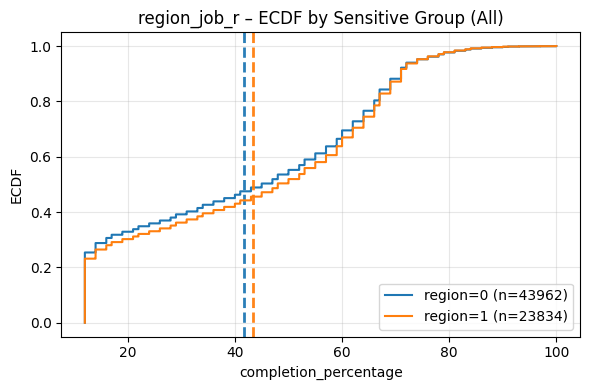

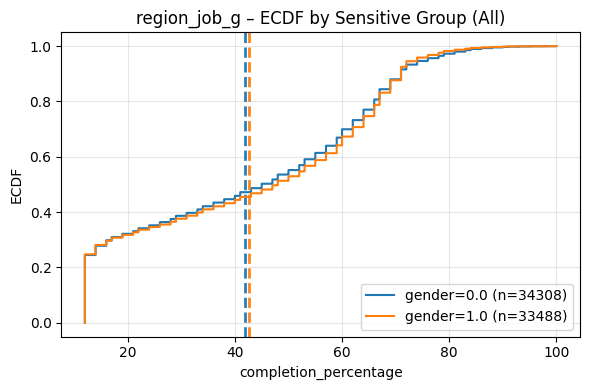

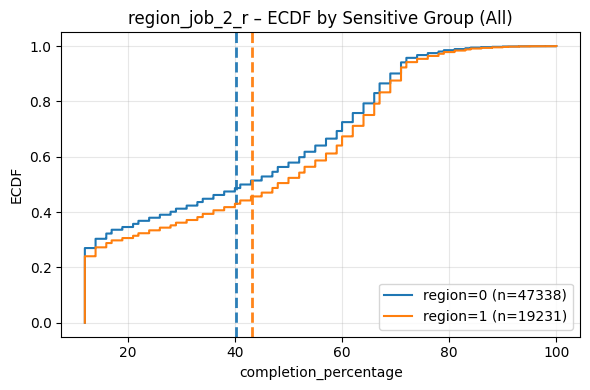

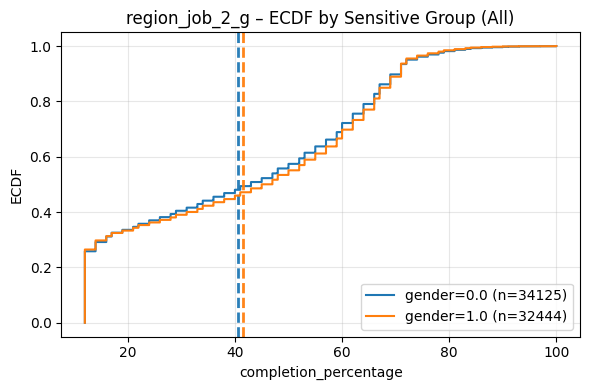

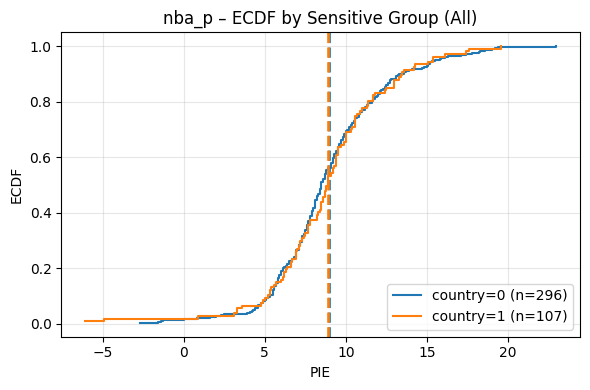

...

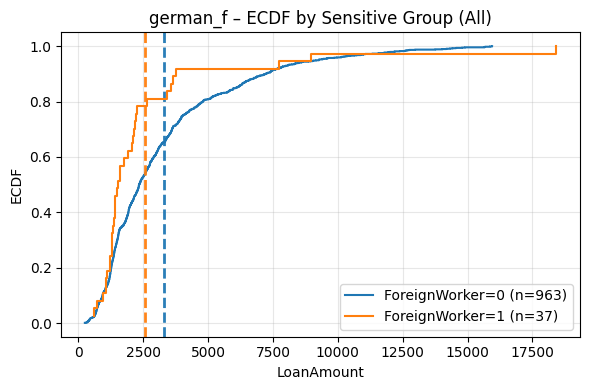

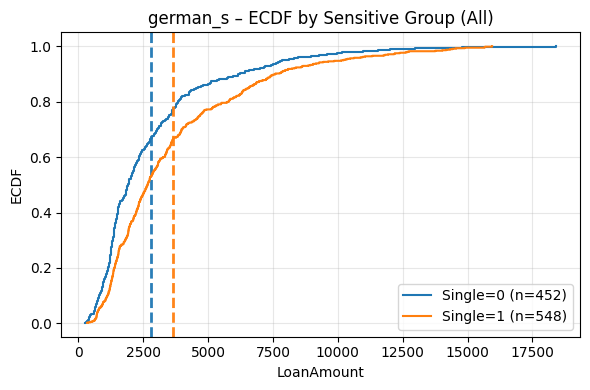

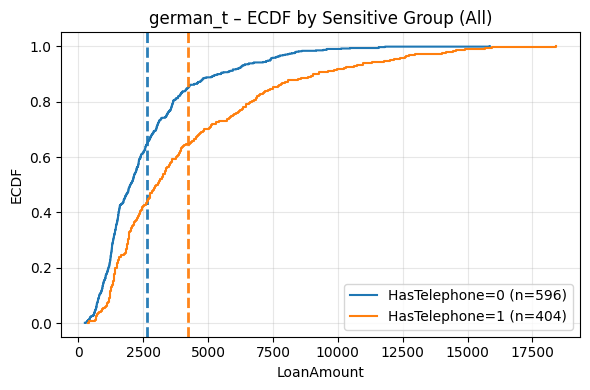

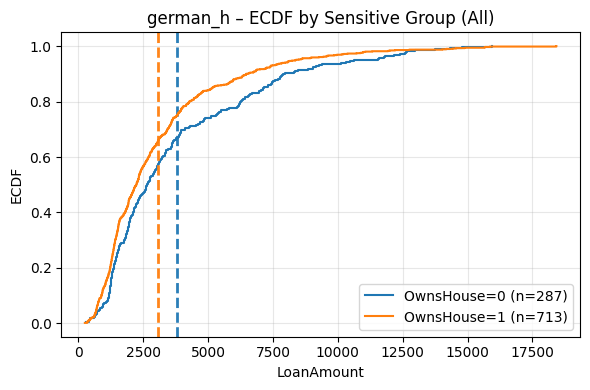

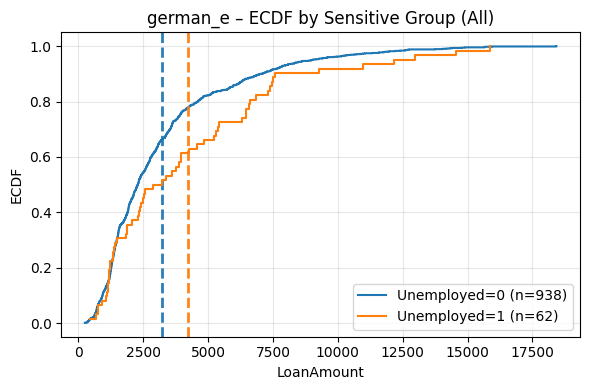

In [86]:
# 민감속성별 데이터셋 시각화
for ds in datasets:
    plot_y_ecdf_with_group_vlines(dt_dict[ds], split="all", vlines=("mean",))

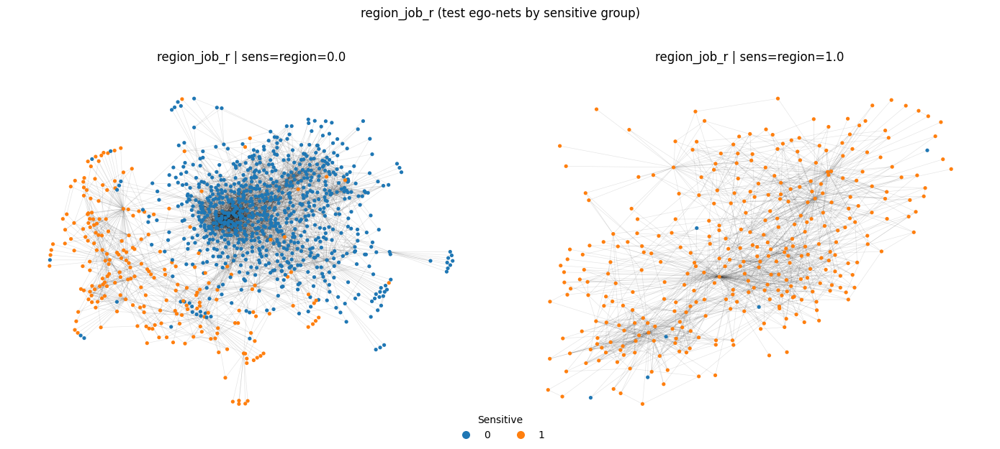

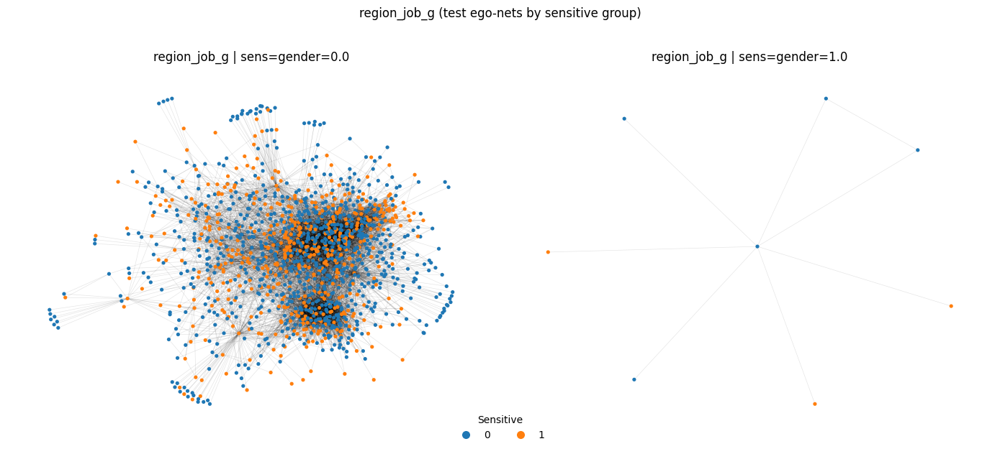

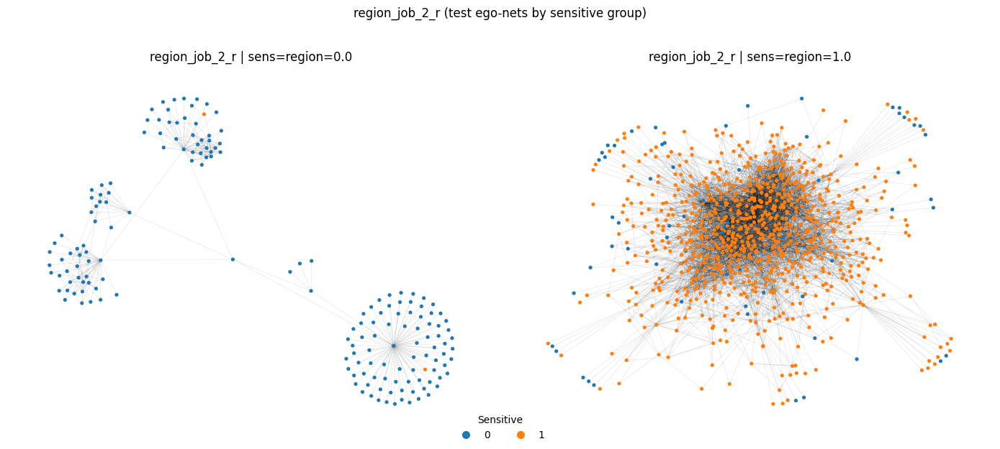

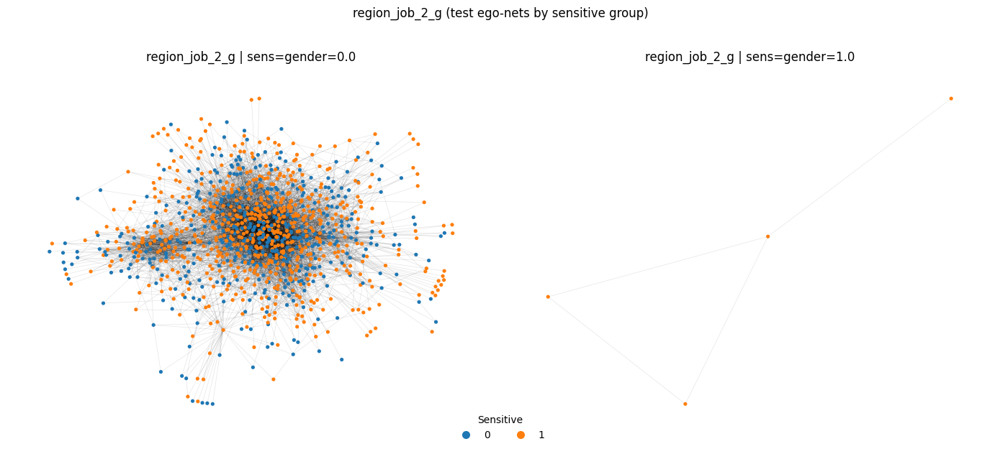

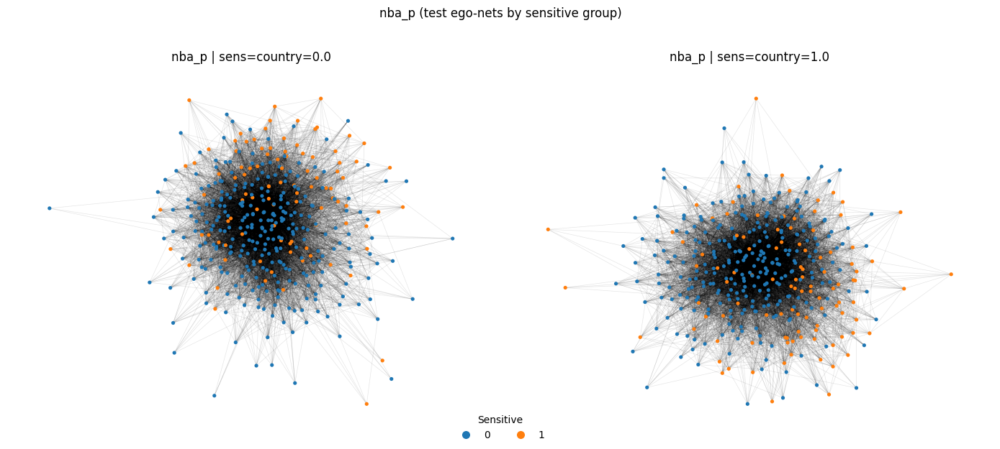

...

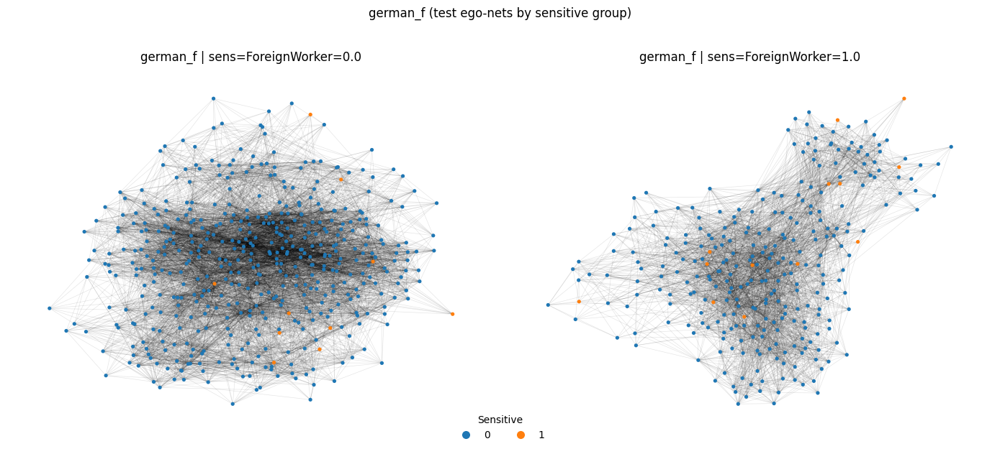

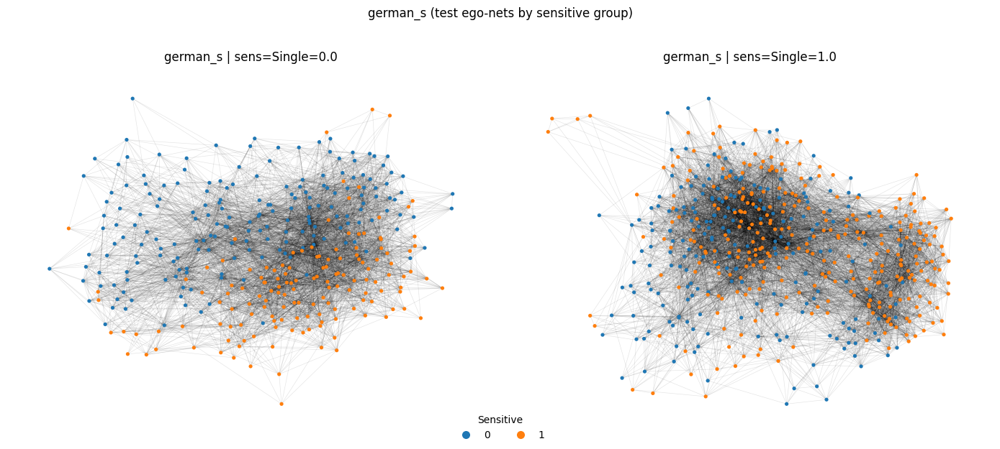

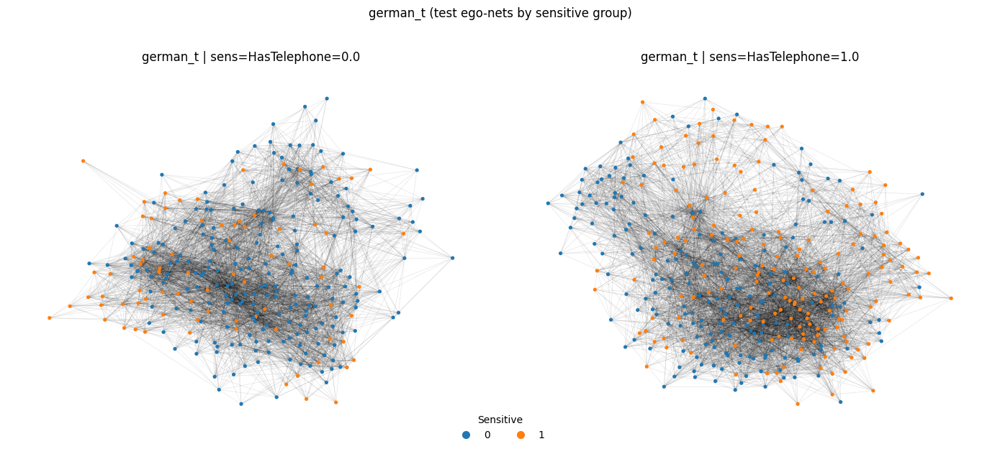

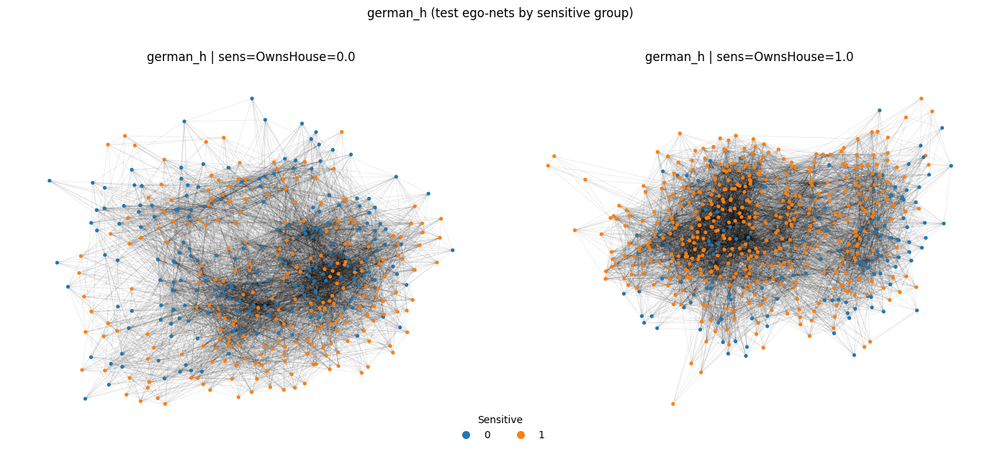

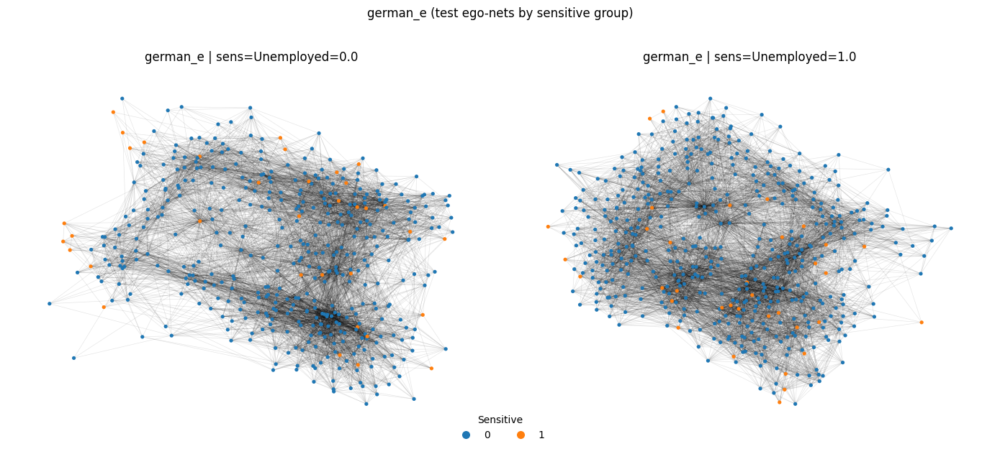

In [124]:
# 테스트 데이터셋 시각화
hops=2
seed=0

for ds in datasets:
    pack = dt_dict[ds]
    data = pack["data"]
    cfg = pack.get("cfg", {}) or {}
    sens_name = cfg.get("sens_attr", "sens")

    visualize_two_group_test_egonets_subplot(
        ds, data, sens_name,
        hops=2, seed=1127, node_size=14
    )

# net_datasets = ['region_job_r', 'region_job_g', 'region_job_2_r', 'region_job_2_g'] 
# net_datasets_v2 =  ['nba_p', 'nba_m', 'german_g', 'german_f', 'german_s', 'german_t', 'german_h', 'german_e']

# for ds in net_datasets_v2:
#     pack = dt_dict[ds]
#     data = pack["data"]
#     cfg = pack.get("cfg", {}) or {}
#     sens_name = cfg.get("sens_attr", "sens")

#     print(f"\n=== {ds} | sens_attr={sens_name} ===")
#     visualize_one_test_egonet(ds, data, sens_name=sens_name, hops=hops, seed=seed, node_size=18)

    
# for ds in net_datasets_v2:
#     induced_k=800   
#     pack = dt_dict[ds]
#     data = pack["data"]
#     cfg = pack.get("cfg", {}) or {}
#     sens_name = cfg.get("sens_attr", "sens")

#     print(f"\n=== {ds} | sens_attr={sens_name} ===")
#     visualize_test_induced_subgraph(ds, data, sens_name=sens_name, k_test_nodes=induced_k, seed=seed, node_size=8 if induced_k > 800 else 14,)


### 구조적 지표 계산

In [132]:
struct_dict = {}
for ds, dt_entry in dt_dict.items():
    data = dt_entry["data"]
    num_nodes = get_num_nodes_from_data(data)

    # df row 수 확인 (대부분 일치해야 정상)
    df = dt_entry.get("df", None)
    if df is not None and len(df) != num_nodes:
        raise ValueError(f"[{ds}] df rows({len(df)}) != num_nodes({num_nodes})")

    # 노드별 구조 지표 계산
    metrics = compute_node_metrics_one_dataset(dt_entry)

    # struct_dict에 저장
    struct_dict[ds] = {"num_nodes": num_nodes, "metrics": metrics}
    struct_dict[ds]["metrics_df"] = pd.DataFrame(metrics)

In [140]:
struct_dict

{'region_job_r': {'num_nodes': 67796,
  'metrics': {'deg': array([5, 9, 6, ..., 2, 2, 9]),
   'log_deg': array([1.79175947, 2.30258509, 1.94591015, ..., 1.09861229, 1.09861229,
          2.30258509]),
   'lcc': array([0.65      , 0.34722222, 0.53333333, ..., 2.        , 2.        ,
          0.34722222]),
   'two_hop': array([ 25., 541.,  43., ...,   6.,   2., 126.]),
   'expansion': array([ 5.        , 60.11111111,  7.16666667, ...,  3.        ,
           1.        , 14.        ]),
   'boundary_rate': array([0.2       , 0.        , 0.        , ..., 0.        , 0.        ,
          0.11111111]),
   'boundary_cnt': array([1., 0., 0., ..., 0., 0., 1.]),
   'boundary_entropy': array([ 5.00402424e-01, -1.00008890e-12, -1.00008890e-12, ...,
          -1.00008890e-12, -1.00008890e-12,  3.48832096e-01])},
  'metrics_df':        deg   log_deg       lcc  two_hop  expansion  boundary_rate  \
  0        5  1.791759  0.650000     25.0   5.000000       0.200000   
  1        9  2.302585  0.347222

### Uncertainty 계산

In [138]:
qpi_dict = {}    
for ds, dt_entry in dt_dict.items():
    data = dt_entry["data"]
    in_dim = data.x.size(1)
    num_nodes = get_num_nodes_from_data(data)

    # df row 수 확인 (대부분 일치해야 정상)
    df = dt_entry.get("df", None)
    if df is not None and len(df) != num_nodes:
        raise ValueError(f"[{ds}] df rows({len(df)}) != num_nodes({num_nodes})")

    # lambda factor 설정
    if ds in ['region_job_r', 'region_job_g', 'region_job_2_r', 'region_job_2_g']:
        lm =0.45
    elif ds in ['nba_p', 'nba_m']:
        lm = 0.1
    elif ds in ['german_g', 'german_f', 'german_s', 'german_t', 'german_h', 'german_e']:
        lm = 0.3

    model, metrics = train_gqnn_one_dataset(
        data=data,
        in_dim=in_dim,
        hidden_dim=64,
        target_coverage=0.9,
        lambda_factor=lm,
        epochs=500,
        device=get_device(),
        verbose=False,
    )

    # qpi_dict에 저장
    qpi_dict[ds] = {"num_nodes": num_nodes, "metrics": metrics}
    qpi_dict[ds]["metrics_df"] = pd.DataFrame(metrics)

In [139]:
qpi_dict

{'region_job_r': {'num_nodes': 67796,
  'metrics': {'L': array([-1.2806573 , -0.72633195,  0.64971113, ..., -1.4146732 ,
          -0.04268754, -1.3800968 ], dtype=float32),
   'U': array([-0.50400037, -0.01310694,  1.3394473 , ..., -0.98101676,
           0.69806373, -0.887113  ], dtype=float32),
   'width': array([0.7766569 , 0.713225  , 0.6897361 , ..., 0.43365645, 0.74075127,
          0.49298382], dtype=float32),
   'covered': array([1., 1., 1., ..., 1., 1., 1.], dtype=float32),
   'violation': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32),
   'width_norm': array([0.7766512 , 0.71321976, 0.689731  , ..., 0.43365324, 0.7407458 ,
          0.49298018], dtype=float32),
   'violation_norm': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)},
  'metrics_df':               L         U     width  covered  violation  width_norm  \
  0     -1.280657 -0.504000  0.776657      1.0        0.0    0.776651   
  1     -0.726332 -0.013107  0.713225      1.0        0.0    0.713220   
  2   

### 지표별 분석

In [143]:
analysis_dict = {}
for ds in struct_dict:
    struct_df = struct_dict[ds]["metrics_df"]
    qpi_df = qpi_dict[ds]["metrics_df"]

    # sanity check
    assert len(struct_df) == len(qpi_df), f"{ds}: node 수 불일치"

    merged_df = pd.concat(
        [struct_df.add_prefix("struct_"),
         qpi_df.add_prefix("qpi_")],
        axis=1
    )

    analysis_dict[ds] = merged_df

In [149]:
analysis_dict[ds].columns

Index(['struct_deg', 'struct_log_deg', 'struct_lcc', 'struct_two_hop',
       'struct_expansion', 'struct_boundary_rate', 'struct_boundary_cnt',
       'struct_boundary_entropy', 'qpi_L', 'qpi_U', 'qpi_width', 'qpi_covered',
       'qpi_violation', 'qpi_width_norm', 'qpi_violation_norm'],
      dtype='object')

In [154]:
# 기본 분포 비교
## 요약 통계
summary_dict = {}
for ds, df in analysis_dict.items():
    summary_dict[ds] = df.describe().T[
        ["mean", "std", "min", "25%", "50%", "75%", "max"]
    ]

## 노드 단위 상관 분석
## Pearson: 선형 관계 / Spearman: 순위 기반 (구조 분석에 더 안전)
corr_dict = {}
for ds, df in analysis_dict.items():
    struct_cols = [c for c in df.columns if c.startswith("struct_")]
    qpi_cols = [c for c in df.columns if c.startswith("qpi_")]

    corr_dict[ds] = compute_correlations(df, struct_cols, qpi_cols)


In [ ]:
# 상관이 높은 구조 지표 추출
top_corr_dict = {
    ds: top_correlations(corr_df, metric="spearman_r", k=10)
    for ds, corr_df in corr_dict.items()
}

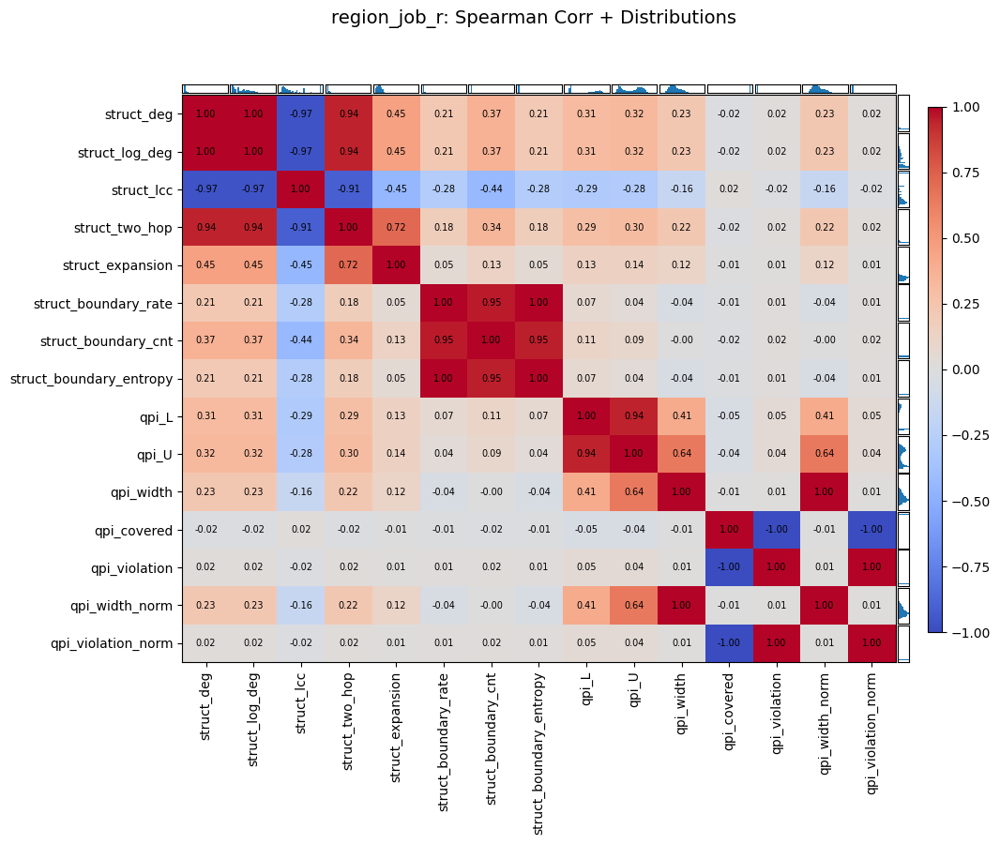

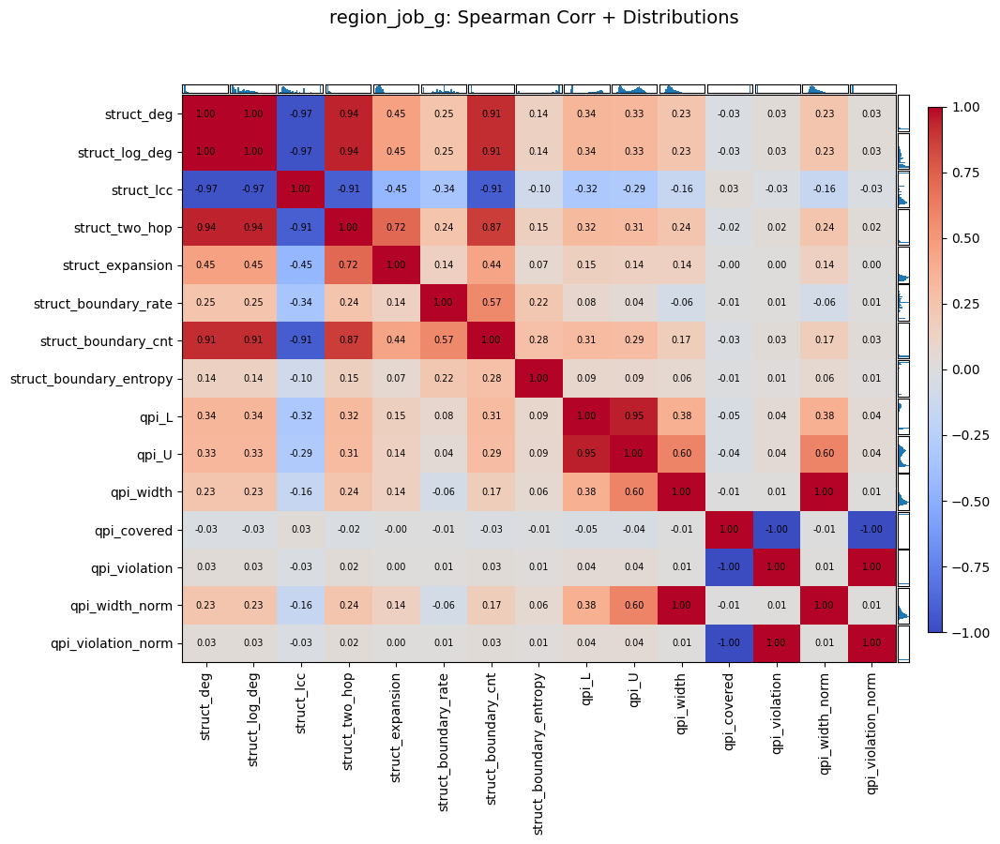

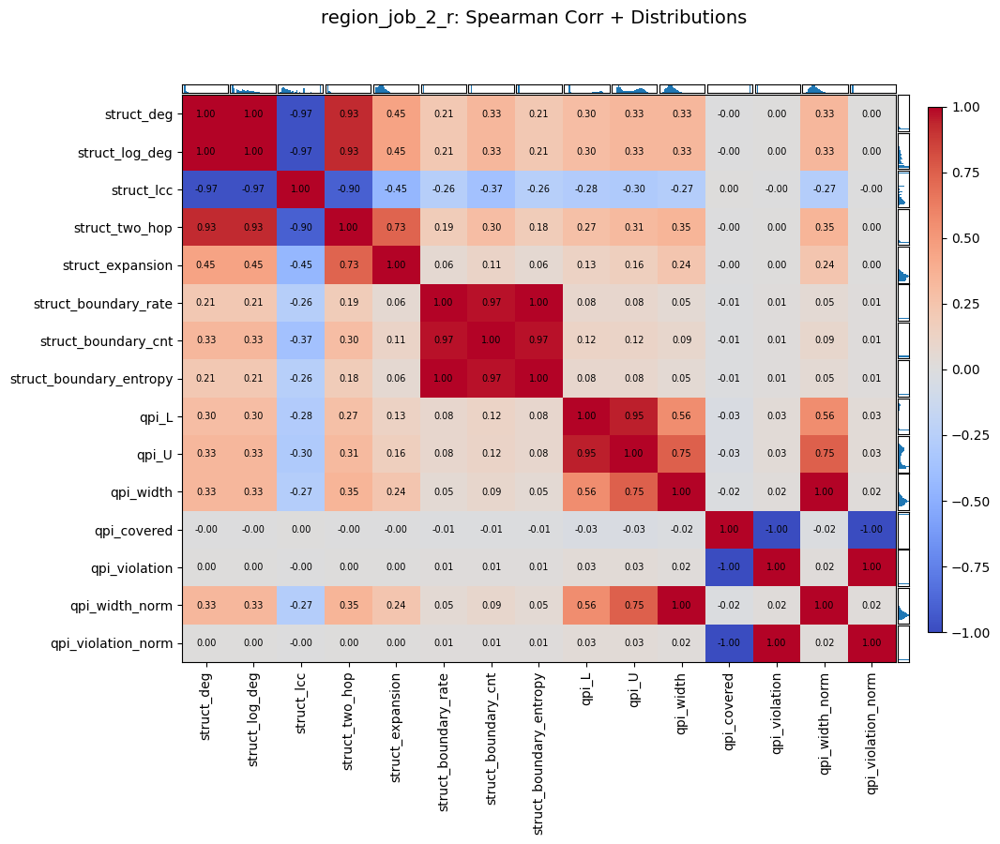

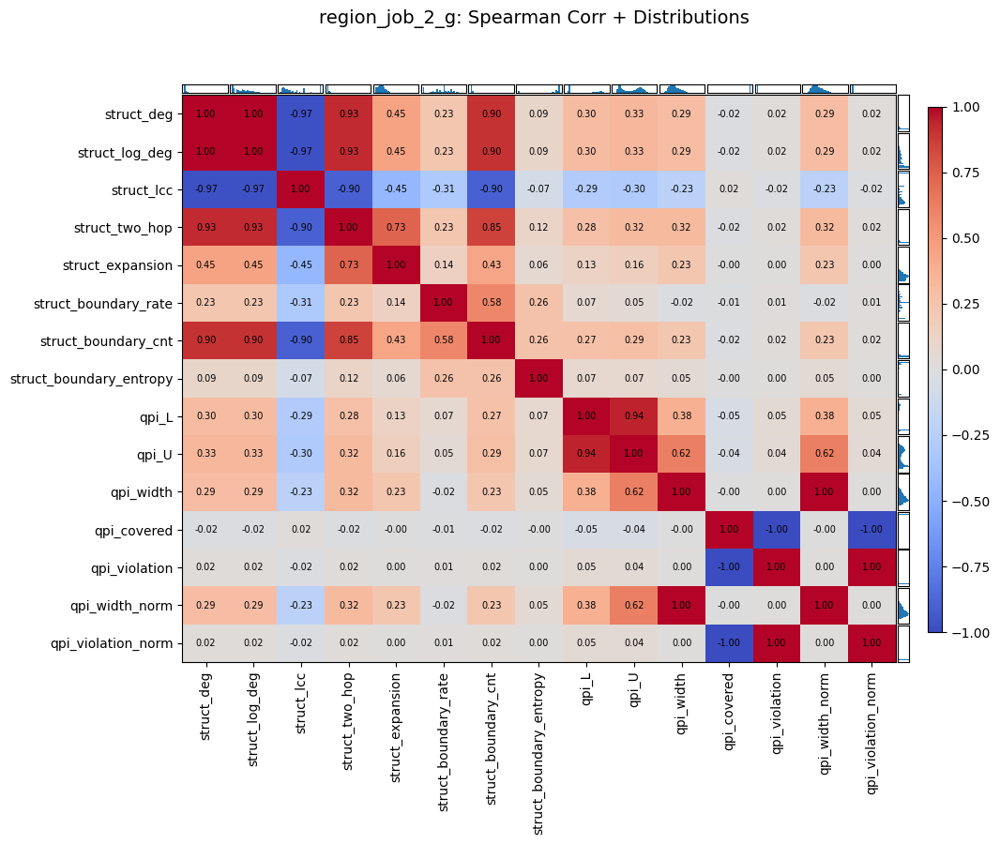

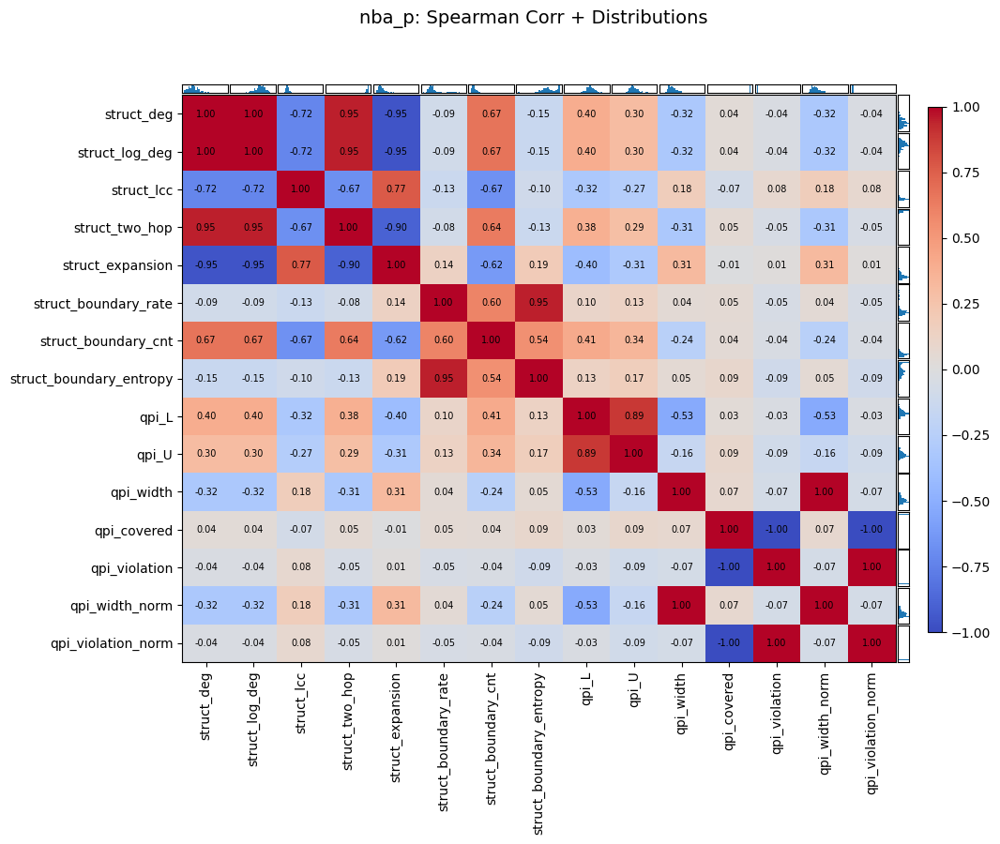

...

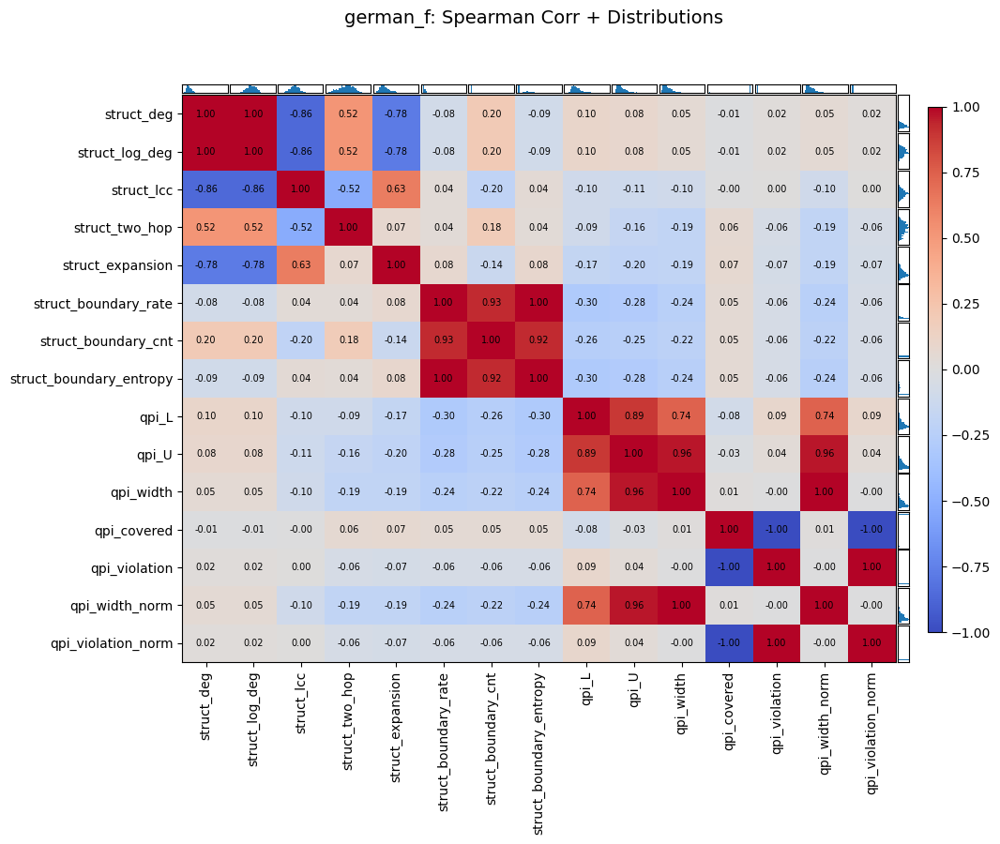

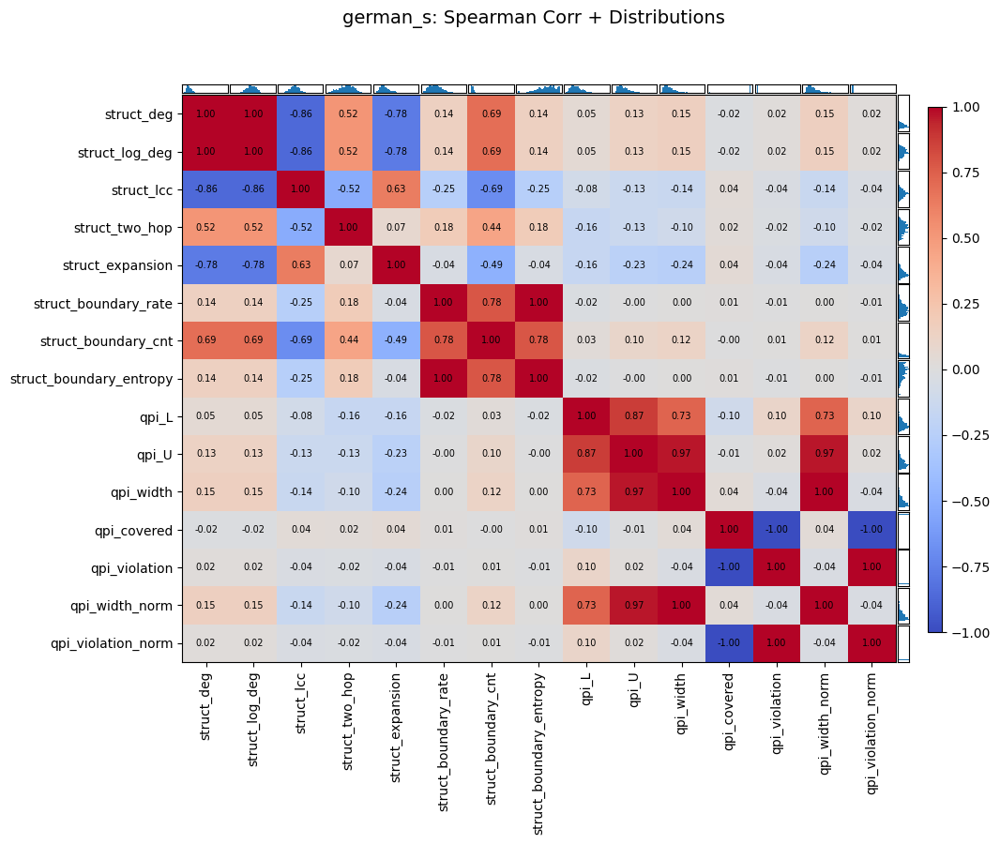

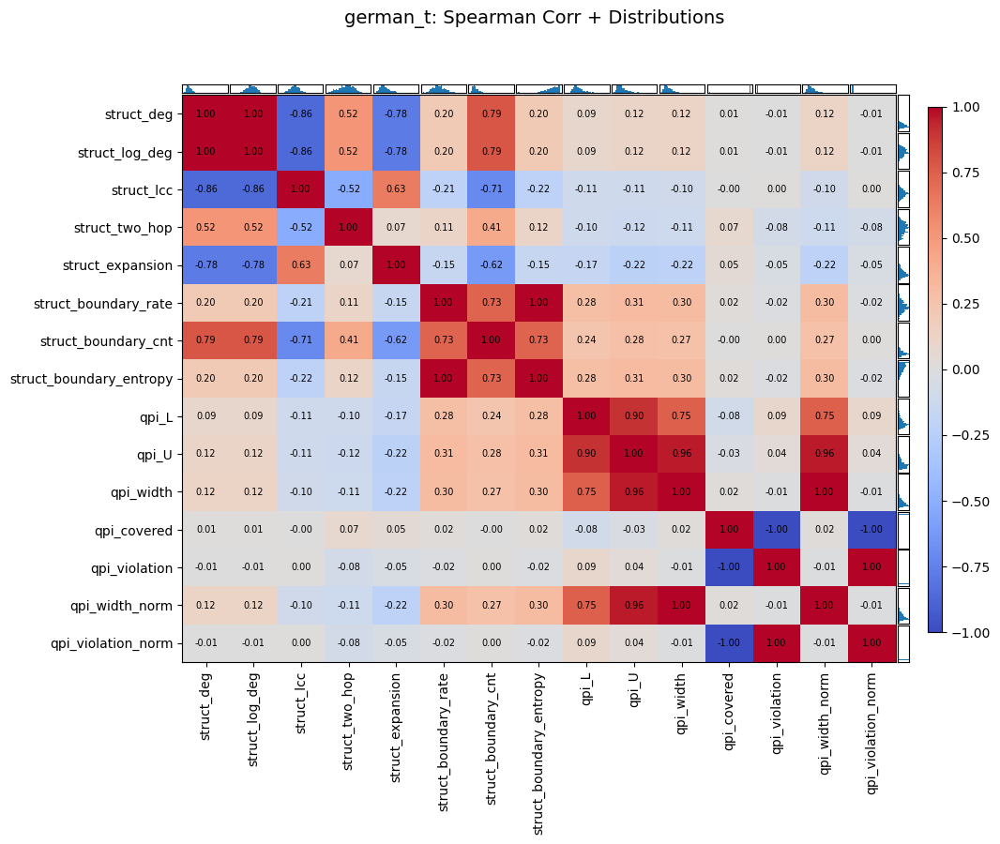

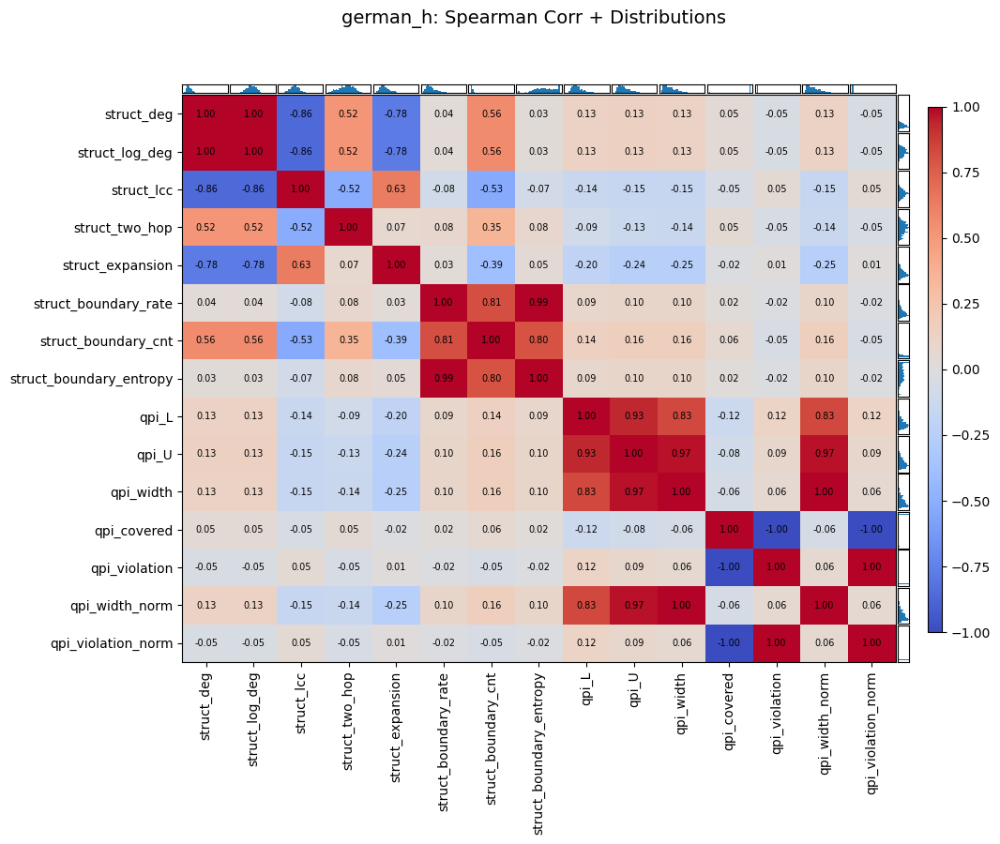

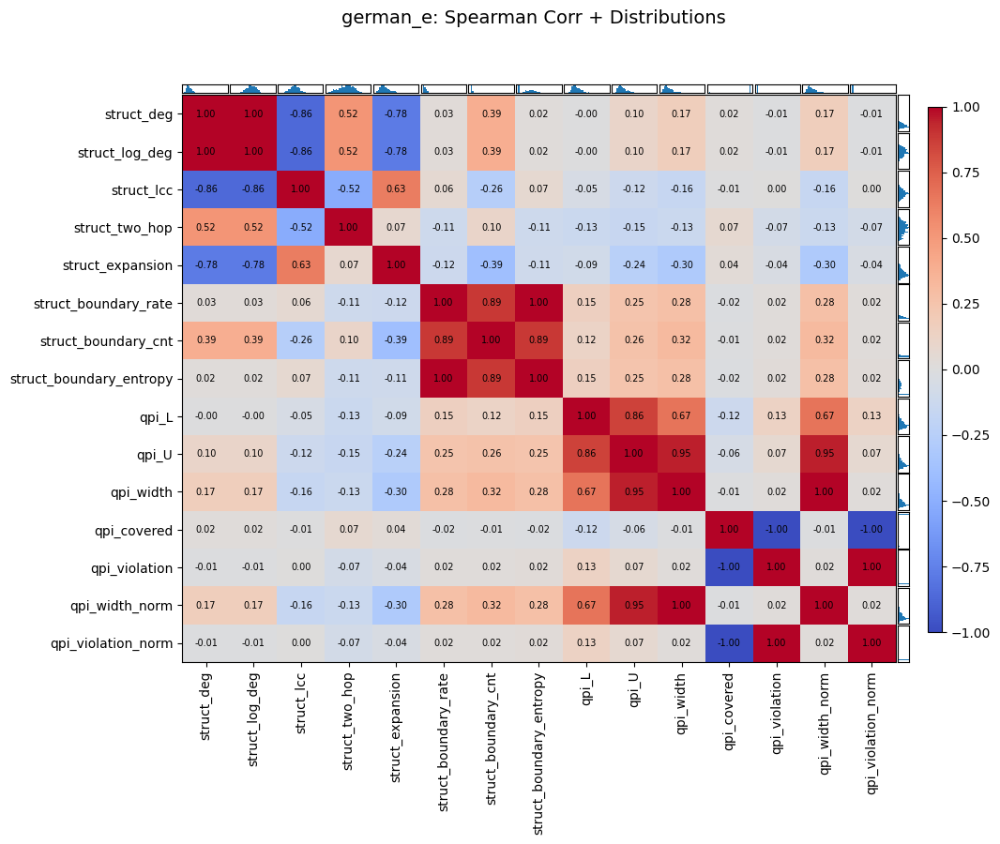

In [171]:
cols = analysis_dict[ds].columns
for ds, df in analysis_dict.items():
    plot_corr_heatmap_with_marginals(
        df,
        cols=cols,
        method="spearman",
        bins=30,
        title=f"{ds}: Spearman Corr + Distributions",
        figsize=(10, 8)
    )


In [ ]:
s